In [1]:
import pandas as pd
import math
import numpy as np
import tensorflow as tf
import sklearn
import matplotlib.pyplot as plt
from tensorflow import keras
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.metrics import confusion_matrix, plot_confusion_matrix
from sklearn.metrics import precision_recall_curve
from sklearn.model_selection import cross_val_score
from sklearn.metrics import precision_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics  import roc_curve
from sklearn.metrics import accuracy_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import cross_val_score
from scipy.stats import reciprocal
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression

from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz
import graphviz
from IPython.display import Image
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier

%matplotlib inline


In [2]:
plt.style.use('ggplot')

plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.serif'] = 'Ubuntu'
plt.rcParams['font.monospace'] = 'Ubuntu Mono'
plt.rcParams['font.size'] = 10
plt.rcParams['axes.labelsize'] = 10
plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['axes.titlesize'] = 13
plt.rcParams['xtick.labelsize'] = 8
plt.rcParams['ytick.labelsize'] = 8
plt.rcParams['legend.fontsize'] = 10
plt.rcParams['figure.titlesize'] = 15
plt.rcParams['image.cmap'] = 'jet'
plt.rcParams['image.interpolation'] = 'none'
plt.rcParams['figure.figsize'] = (16, 8)
plt.rcParams['lines.linewidth'] = 2
plt.rcParams['lines.markersize'] = 8

colors = ['xkcd:sea blue', 'xkcd:sage green', 'xkcd:pale red', 'xkcd:pale orange', 'xkcd:terra cotta', 'xkcd:dull purple', 'xkcd:teal', 'xkcd:goldenrod', 'xkcd:cadet blue', 
          'xkcd:scarlet']

In [5]:
with open('file0.txt','w') as file:
  file.write('C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,target\n')
righe=[]
with open('magic04 (1).data') as file:
  riga=file.readlines()
  for i in range(len(riga)):
    righe.append(riga[i])
with open('file0.txt','a') as file:
  for i in righe:
    file.write(i)

    
dataset=pd.read_csv(r'file0.txt')
dataset.to_csv(r'magic_gamma_telescope.csv',index=None)

In [6]:
dataset= dataset.drop_duplicates(subset=None, keep='first', inplace=False, ignore_index=True)  #eliminiamo le righe duplicate
dataset

,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,target
0,28.7967,16.0021,2.6449,0.3918,0.1982,27.7004,22.0110,-8.2027,40.0920,81.8828,g
1,31.6036,11.7235,2.5185,0.5303,0.3773,26.2722,23.8238,-9.9574,6.3609,205.2610,g
2,162.0520,136.0310,4.0612,0.0374,0.0187,116.7410,-64.8580,-45.2160,76.9600,256.7880,g
3,23.8172,9.5728,2.3385,0.6147,0.3922,27.2107,-6.4633,-7.1513,10.4490,116.7370,g
4,75.1362,30.9205,3.1611,0.3168,0.1832,-5.5277,28.5525,21.8393,4.6480,356.4620,g
...,...,...,...,...,...,...,...,...,...,...,...
18900,21.3846,10.9170,2.6161,0.5857,0.3934,15.2618,11.5245,2.8766,2.4229,106.8258,h
18901,28.9452,6.7020,2.2672,0.5351,0.2784,37.0816,13.1853,-2.9632,86.7975,247.4560,h
18902,75.4455,47.5305,3.4483,0.1417,0.0549,-9.3561,41.0562,-9.4662,30.2987,256.5166,h
18903,120.5135,76.9018,3.9939,0.0944,0.0683,5.8043,-93.5224,-63.8389,84.6874,408.3166,h


Informazioni sulle features:

C1: asse maggiore dell'ellisse [mm]

C2: asse minore dell'ellisse [mm]

C3: log_10 della somma del contenuto di tutti i pixel [in #phot]

C4: rapporto della somma dei due pixel più alti su C3  [ratio]

C5: rapporto del pixel più alto su C3  [ratio]

C6: distanza dal pixel più alto al centro, proiettata sull'asse maggiore [mm]

C7: radice cubica del terzo momento lungo l'asse maggiore [mm]

C8: radice cubica del terzo momento lungo l'asse minore [mm]

C9: angolo dell'asse maggiore con il vettore rispetto all'origine [deg]

C10: distanza dall'origine al centro dell'ellisse [mm]

Target: g,h  - gamma (segnale), hadron (background) (class)

INTRODUZIONE AL DATASET
==========
I raggi gamma che siamo interessati a rivelare sono prodotti nello spazio da
eventi o da oggetti che rilasciano una grande quantità di energia.
Il loro studio è utile perchè ci permette di osservare e provare a comprendere meglio le sorgenti 
da cui provengono che possono essere radio-galassie, Blazars, Microquasar..

Quando un raggio gamma arriva fino a noi ed entra nell'atmosfera terrestre 
interagisce con essa producendo una cascata di particelle subatomiche. 
Tali particelle, data l'elevata energia, viaggiano (nell'aria) più velocemente della
 luce e si verifica così l'effetto Cerenkov: come quando un aereo supera la 
velocità del suono si crea un boom sonico, così quando una particella viaggia 
più veloce della luce si crea un "boom fotonico" che è un flash di luce blu della 
durata di $10^{-12}$  secondi, non visibile ad occhio nudo. Per rivelare questi flash 
facciamo uso di particolari telescopi chiamati per l'appunto telescopi Cerenkov. 
I dati ricavati da questi telescopi sono poi processati per determinare i parametri 
di Hillas che descrivono nel complesso lo sciame di particelle subatomiche.

MAGIC (Major Atmospheric Gamma-ray Imaging Cherenkov Telescopes),Spagna:

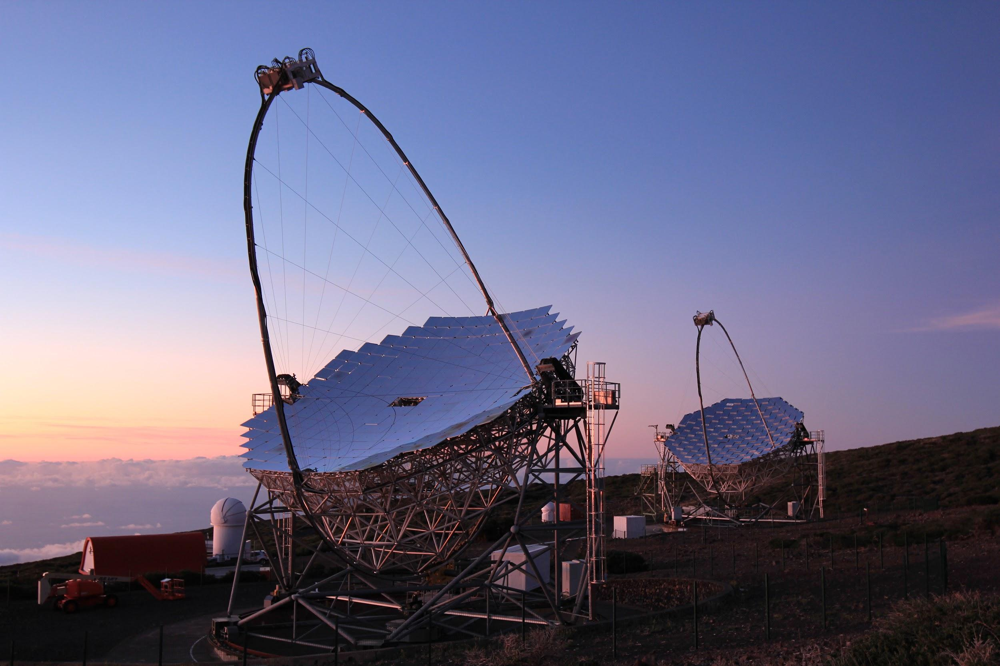

Le cascate di particelle subatomiche non vengono prodotte soltanto dai raggi gamma ma anzi, la maggior parte (circa il 90%) di quelle che riusciamo a rivelare hanno origine da protoni ad alta energia. Anche in questo caso possiamo studiare gli sciami di particelle prodotti con telescopi Cerenkov.

Il nostro obbiettivo è quello di determinare, dati i parametri di Hillas di uno 
sciame, se questo è originato da un raggio gamma o da un insieme di altre particelle, gli adroni, quali ad esempio il protone ma anche nuclei di elio.



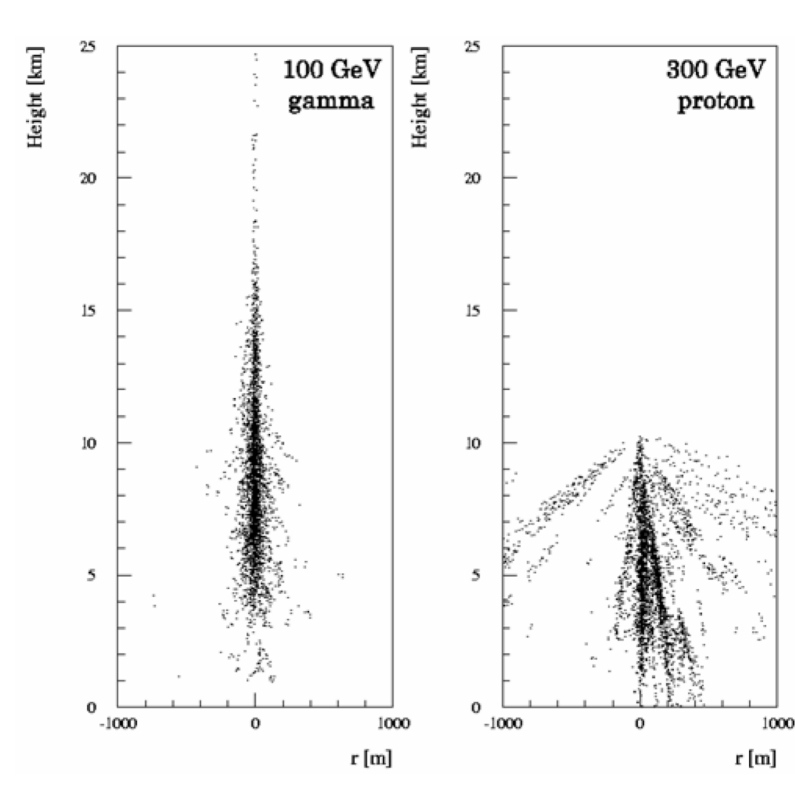

In [7]:
# ! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip 
import pandas_profiling as pp
pp.ProfileReport(dataset, title = 'Pandas Profiling report of "dataset"', html = {'style':{'full_width': True}})

In [ ]:
#encoding dei target
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
dataset['target']=le.fit_transform(dataset['target'].values)
dataset

,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,target
0,28.7967,16.0021,2.6449,0.3918,0.1982,27.7004,22.0110,-8.2027,40.0920,81.8828,0
1,31.6036,11.7235,2.5185,0.5303,0.3773,26.2722,23.8238,-9.9574,6.3609,205.2610,0
2,162.0520,136.0310,4.0612,0.0374,0.0187,116.7410,-64.8580,-45.2160,76.9600,256.7880,0
3,23.8172,9.5728,2.3385,0.6147,0.3922,27.2107,-6.4633,-7.1513,10.4490,116.7370,0
4,75.1362,30.9205,3.1611,0.3168,0.1832,-5.5277,28.5525,21.8393,4.6480,356.4620,0
...,...,...,...,...,...,...,...,...,...,...,...
18900,21.3846,10.9170,2.6161,0.5857,0.3934,15.2618,11.5245,2.8766,2.4229,106.8258,1
18901,28.9452,6.7020,2.2672,0.5351,0.2784,37.0816,13.1853,-2.9632,86.7975,247.4560,1
18902,75.4455,47.5305,3.4483,0.1417,0.0549,-9.3561,41.0562,-9.4662,30.2987,256.5166,1
18903,120.5135,76.9018,3.9939,0.0944,0.0683,5.8043,-93.5224,-63.8389,84.6874,408.3166,1


Gli eventi gamma sono stati mappati in 0, gli eventi di fondo sono stati mappati in 1.

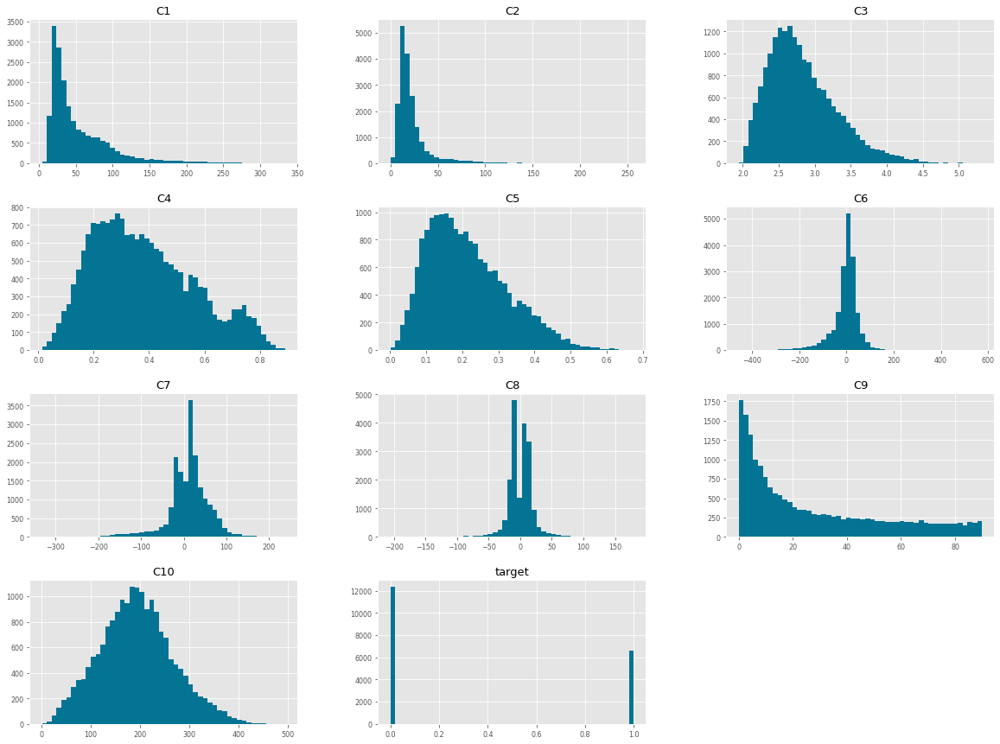

In [ ]:
dataset.hist(bins=50, figsize=(20,15), color= colors[0])
plt.show()

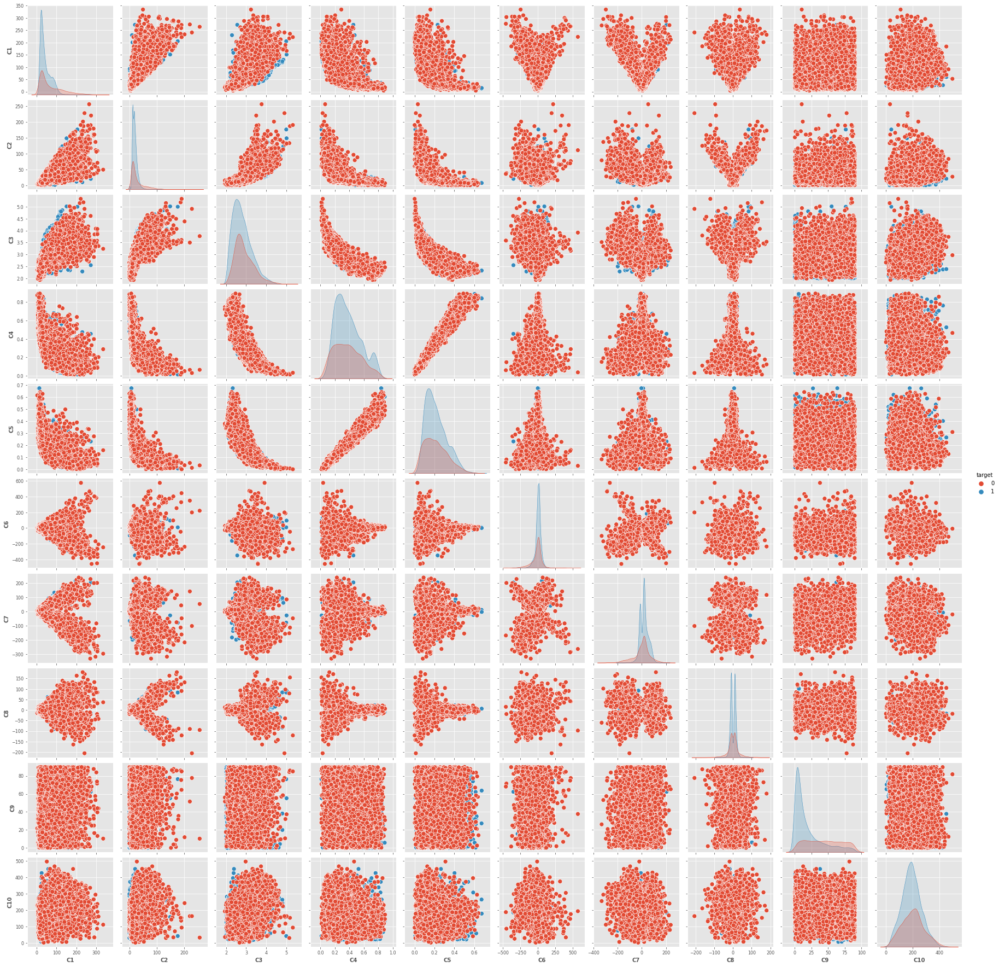

In [ ]:
import seaborn as sns
df = dataset.copy() 
sns.pairplot(data=df, hue="target") #serve a vedere la correlazione tra le varie features

In [ ]:
gamma, back = np.bincount(dataset['target'])
total = gamma+back
print('Examples:\n    Total: {}\n    Positive: {} ({:.2f}% of total)\n'.format(
    total, gamma, 100 * gamma / total))

Examples:
    Total: 18905
    Positive: 12332 (65.23% of total)



Invertiamo nel vettore target gli 1 con gli 0 per chiarezza: scikitlearn identifica come 1 l'evento "positivo" che per noi è il rilevamento del raggio gamma. Non serve farlo, ma se non lo facciamo dovremmo identificare l'evento positivo come un segnale di fondo ed è controintuitivo, potrebbe crearci qualche problema di interpretazione dei risultati

In [ ]:
from sklearn.model_selection import train_test_split
X,y=dataset.iloc[:,:-1].values, dataset.iloc[:,-1].values
#nel vettore target invertiamo gli 0 con gli 1
print(f'vettore target originale: {y}')
for i in range(len(y)):
  if y[i]==0:
    y[i]=1
  else:
    y[i]=0
print(f'vettore target con i valori scambiati: {y}') 

vettore target originale: [0 0 0 ... 1 1 1]
vettore target con i valori scambiati: [1 1 1 ... 0 0 0]


In [ ]:
#funzioni utili
def display_scores(scores):
    print(f'scores: {scores}')
    print(f'mean: {scores.mean()}')
    print(f'Standard deviation: {scores.std()}')

def plot_precision_recall_vs_threshold(precisions, recalls, thresholds):
 plt.plot(thresholds, precisions[:-1], "b--", label="Precision")
 plt.plot(thresholds, recalls[:-1], "g-", label="Recall")
 plt.grid(True)
 plt.xlabel('threshold')
 plt.legend()

def plot_decision_vs_recall(precisions, recalls, thresholds):
 plt.plot(recalls[:-1], precisions[:-1], "b")
 plt.grid(True)
 plt.xlabel('Recall')
 plt.ylabel('Precision')

def plot_roc_curve(fpr,tpr):
  plt.plot(fpr,tpr)
  plt.plot([0, 1], [0, 1], 'k--')
  #plt.scatter(fpr[150],tpr[150],color='r')
  plt.xlabel('false positive rate')
  plt.ylabel('true positive rate')
  plt.grid(True)




LOGISTIC REGRESSION
========
La regressione logistica è un modello probabilistico discriminativo per la classificazione.

Facendo riferimento alla classificazione binaria, la regressione logistica modella la probabilità di un elemento di appartenere alla classe $C_1$ o $C_2$ facendo uso della funzione logistica:

$$p(C_1|\phi)=y(\vec{\phi})=\sigma(\vec{w}^T\vec{\phi})=\frac{1}{1+e^{-\vec{w}^T\vec{\phi}}}$$
con $p(C_2|\vec{\phi})=1-p(C_1|\vec{\phi})$.

Funzione logistica:

  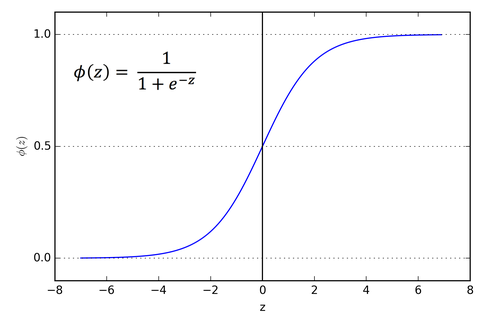



I vettori $\vec{\phi}$ sono delle funzioni base ovvero sono in generale delle trasformazioni non lineari dei valori di input originali $\vec{x}$. Queste funzioni sono utili nel caso in cui si pensa o si fa l'ipotesi che il dataset non è linearmente seprarabile nello spazio delle features originali. L'idea è quella di portare il problema in uno spazio con dimensionalità maggiore rispetto a quella iniziale, dove le classi diventano linearmente separabili. In questo nuovo spazio le classi possono essere separate da un iperpiano, se poi invece facciamo la trasformazione inversa tornando allo spazio delle features originali vedremo una superficie di separazione curva.

Per un dataset $(\phi_n,t_n)$ dove $t_n=(0,1)$ e $\vec{\phi_n}=\phi(\vec{x_n})$ la funzione likelihood può essere scritta
$$p(t|\vec{w})=\prod_{n=1}^{N}y_{n}^{t_n}(1-y_n)^{1-t_n}$$

La funzione costo è l'opposto del logaritmo della likelihood:
$$E(\vec{w})=-\sum_{n=1}^{N}[t_n ln(y_n)+(1-t_n)ln(1-y_n)]$$.

**Ottimizzazione della funzione costo**

Per ottimizzare $E(\vec{w})$ esistono molti modi. Di seguito useremo il "Newton conjugate-gradient algorithm".

Questo algoritmo fa rifermimento al metodo di Newton-Raphson ma differisce da questo perchè fa uso del cojugate gradient per calcolare alcuni termini. Per capire meglio di cosa parliamo ricordiamo che il metodo di Newton Raphson aggiorna i pesi del modello nel seguente modo:

$$\vec{w}^{(new)}=\vec{w}^{(old)}-H^{-1}\vec{\nabla} E(\vec{w})   $$

ed è proprio nel calcolo del termine di correzione che interviene il cojugate gradient.

Se chiamiamo $\vec{d}=-H^{-1}\vec{\nabla} E(\vec{w})$, vediamo che possiamo riscrivere tale espressione come

$$H\vec{d}=-\vec{\nabla} E(\vec{w})$$ 

e questo altro non è un sistema di equazioni lineari del tipo $A\vec{x}=\vec{b}$. L'incognita nel nostro caso è $\vec{d}$.

Se definiamo $$\Phi(\vec{d})=\frac{1}{2}\vec{d}^TH\vec{d}+\vec{d}^T\vec{\nabla} E$$ vediamo che il sistema di equazioni lineari è equivalente a risolvere il problema di ottimizzazione $\nabla \Phi(\vec{d})=0$.

Un modo per farlo è usare il classico metodo del gradient descent 

$$\vec{d}^{(k+1)}=\vec{d}^{(k)}-\eta\vec{\nabla}\Phi(\vec{d}^{(k)})$$

dove la direzione di discesa è determinata dal gradiente della funzione costo calcolato nel punto $\vec{d}^{k}$. Quindi il percorso fatto da questo algoritmo è tale che $d^{k+1}$ è ottimale rispetto alla precedente direzione di discesa.

Quello che usa il Newton-CG algorithm è appunto il metodo del gradiente coniugato nel quale si vuole rendere $d^{k+1}$ ottimale rispetto a *tutte* le direzioni di discesa precedenti. Per fare ciò si dimostra che la direzione di discesa deve essere, facendo riferimento al generico sistema $A\vec{x}=\vec{b}$, A-coniugata a *tutte* le direzioni precedenti.

Due direzioni $\vec{p}^{(k)}, \vec{p}^{(l)}$ con $k\not=l$ sono A-coniugate se: $${\vec{p}^{(k)}}^TA\vec{p}^{(l)}=0$$


Confronto dei due metodi di discesa: in rosso il cojugate gradient, in bianco la discesa del gradiente semplice

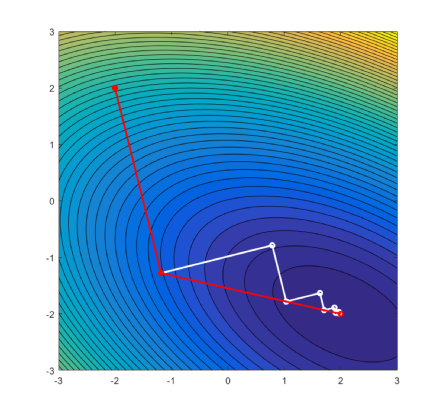






In [ ]:
#divisione in training set e test set
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3,random_state=42,stratify=y)

# istanziamo e addestriamo il modello
logistic_clf=Pipeline([
                             #('poly_features', PolynomialFeatures(degree=4)),
                             ('scaler',StandardScaler()),
                             ('logistic',LogisticRegression(solver='newton-cg',class_weight='balanced'))
                             ])
logistic_clf.fit(X_train,y_train)

Pipeline(memory=None,
         steps=[('scaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('logistic',
                 LogisticRegression(C=1.0, class_weight='balanced', dual=False,
                                    fit_intercept=True, intercept_scaling=1,
                                    l1_ratio=None, max_iter=100,
                                    multi_class='auto', n_jobs=None,
                                    penalty='l2', random_state=None,
                                    solver='sag', tol=0.0001, verbose=0,
                                    warm_start=False))],
         verbose=False)

Valutiamo le prestazioni del modello sul training set

In [ ]:
predict_train=logistic_clf.predict(X_train)
proba_train=logistic_clf.predict_proba(X_train)[:,1]
print(f'AUC_train:{roc_auc_score(y_train,proba_train)}')

AUC_train:0.8470365871859931


Valutiamo le prestazioni del modello usando la cross validation

In [ ]:
# cross validation per verificare le prestazioni del modello base, in seguito faremo un tuning dei parametri per cercare di migliorarlo.
scores=cross_val_score(logistic_clf,X_train,y_train,cv=5,scoring='roc_auc')
display_scores(scores)

scores: [0.85761956 0.83488424 0.84203858 0.86276002 0.83631129]
mean: 0.8467227389614459
Standard deviation: 0.011370353377794754


Le prestazioni son simili e possiamo essere fiduciosi del fatto che il modello non è andato in overfitting e generalizza bene. 

Ricordiamo però che i risultati ottenuti vengono dall'assunzione di un dataset linearmente separabile nello spazio delle features. Proviamo a far cadere questa assunzione implementando delle funzioni base polinomiali di diverso grado e vediamo se il modello migliora o meno.


In [ ]:
degrees=[1,2,3,4,5,6] #valori dei gradi su cui iterare
mean_score_fold=[] #per ogni grado appendiamo la AUC media
std_score_fold=[] #deviazione standard relativa agli elementi della lista mean_score_fold
score_train=[] # valore AUC  sul training set, uno per ogni grado
for degree in degrees:
    
    #istanziamo il modello
    bestlogistic_clf=Pipeline([
                             ('poly_features', PolynomialFeatures(degree=degree,include_bias=False)),
                             ('scaler',StandardScaler()),
                             ('logistic',LogisticRegression(solver='newton-cg',class_weight='balanced'))
                             ])
    
    #per ogni grado facciamo una cross validation con cv=5
    scores=cross_val_score(bestlogistic_clf,X_train,y_train,scoring='roc_auc',cv=5) #resituisce 5 valori di AUC, uno per fold
    mean_score_fold.append(scores.mean())
    std_score_fold.append(scores.std())
    
    
    bestlogistic_clf.fit(X_train,y_train)
    predict_train=bestlogistic_clf.predict(X_train)
    proba_train=bestlogistic_clf.predict_proba(X_train)[:,1]
    score_train.append(roc_auc_score(y_train,proba_train))
    
    print(f'Degree: {degree}')
    print(f'Scores: {scores}')
    print(f'Mean: {scores.mean()}')
    print(f'Standard deviation: {scores.std()}')
    print(f'AUC_train: {roc_auc_score(y_train,proba_train)}')
    print('===================================================')


Degree: 1
Scores: [0.85762018 0.83489105 0.84204167 0.86275879 0.83630882]
Mean: 0.8467240994820194
Standard deviation: 0.011368905169773617
AUC_train: 0.8470367603889088
Degree: 2
Scores: [0.92019163 0.90120398 0.91272904 0.91232837 0.90588139]
Mean: 0.9104668821516559
Standard deviation: 0.00648045138025922
AUC_train: 0.9128363006786784
Degree: 3
Scores: [0.93059205 0.91271856 0.92410877 0.92044579 0.9166091 ]
Mean: 0.9208948559596747
Standard deviation: 0.006160942350252836
AUC_train: 0.9291549597991084
Degree: 4
Scores: [0.9308958  0.91465921 0.92513211 0.92378971 0.91920205]
Mean: 0.9227357757980907
Standard deviation: 0.005498316001656062
AUC_train: 0.9367397134293425
Degree: 5
Scores: [0.92740054 0.91409007 0.92488663 0.92415205 0.91907825]
Mean: 0.9219215076638381
Standard deviation: 0.0047582056899676
AUC_train: 0.9442678297061015
Degree: 6
Scores: [0.92457215 0.9117968  0.92205221 0.92471041 0.91819248]
Mean: 0.9202648094977045
Standard deviation: 0.004847949322495113
AUC_tra

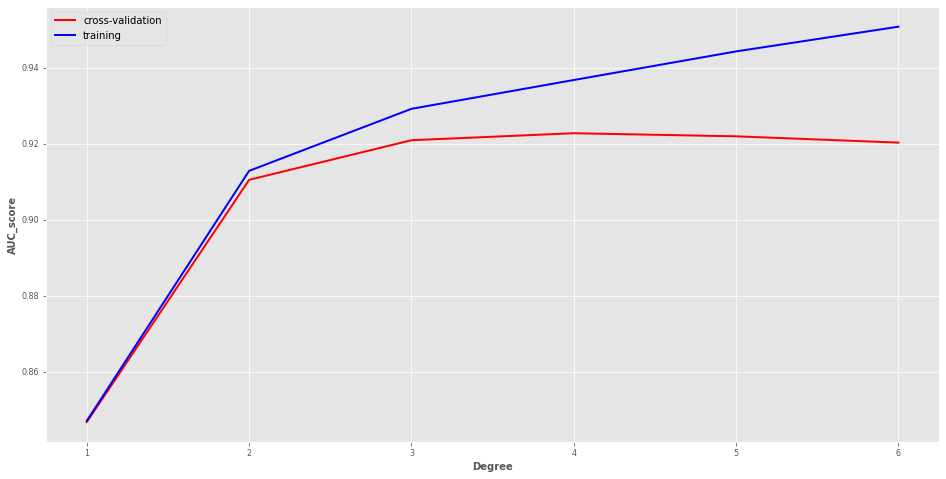

In [ ]:
def plot_AUC_vs_degree(deg,fold,train):
    plt.plot(deg,fold,color='red',label='cross-validation')
    plt.plot(deg,train,color='blue',label='training')
    plt.legend()
    plt.grid(True)
    plt.xlabel('Degree')
    plt.ylabel('AUC_score')
plot_AUC_vs_degree(degrees,mean_score_fold,score_train)
plt.show()

Passando da un modello lineare nello spazio delle features originale (grado dei polinomi=1), ad un modello che fa uso di funzioni base polinomiali, vediamo come la prestazione in termini di AUC aumenta notevolmente. 

Per valori di grado compresi tra 2 e 5 le prestazioni del modello sulle fold di test resta crica costante. La differenza sta di quanto vanno in overfitting: più aumentiamo il grado, più il modello va in overfitting. 

Per valori di grado maggiori di 5 il modello va sempre più in overfitting ma la situazione è peggiorata dal fatto che adesso cominciamo a peggiorare anche le prestazioni sulle fold di test. Questo è sicuramente un range da scartare.

Per le considerazioni precedenti riteniamo accettabili funzioni base di grado 3. Tale grado permette infatti di avere un buon aumento sulle fold di test rispetto al grado 2, e l'overfitting resta tutto sommato limitato.

In [ ]:
logistic_model=Pipeline([
                             ('poly_features', PolynomialFeatures(degree=3),include_bias=False)),
                             ('scaler',StandardScaler()),
                             ('logistic',LogisticRegression(solver='newton-cg',class_weight='balanced'))
                             ])
logistic_model.fit(X_train,y_train)

Pipeline(memory=None,
         steps=[('poly_features',
                 PolynomialFeatures(degree=3, include_bias=False,
                                    interaction_only=False, order='C')),
                ('scaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('logistic',
                 LogisticRegression(C=1.0, class_weight='balanced', dual=False,
                                    fit_intercept=True, intercept_scaling=1,
                                    l1_ratio=None, max_iter=100,
                                    multi_class='auto', n_jobs=None,
                                    penalty='l2', random_state=None,
                                    solver='newton-cg', tol=0.0001, verbose=0,
                                    warm_start=False))],
         verbose=False)

Valutazione sul training set

In [ ]:
predict_train=logistic_model.predict(X_train)
proba_train=logistic_model.predict_proba(X_train)[:,1]
#print(proba_train1[:10])
#print(predict_train)
#print(proba_train)
print(f'AUC_train:{roc_auc_score(y_train,proba_train)}')

AUC_train:0.9291549597991084


Valutazione cross-validation

In [ ]:
y_score=cross_val_predict(logistic_model,X_train,y_train,cv=5,method='predict_proba')[:,1]
print(y_score[:20]) #printiamo i primi 20 risultati
scores=cross_val_score(logistic_model,X_train,y_train,cv=5,scoring='roc_auc')
display_scores(scores)

[9.50016980e-01 9.32523486e-01 6.51586144e-01 7.31377242e-01
 9.93446037e-01 2.37815904e-03 9.38456408e-01 9.50653790e-01
 2.89727722e-06 9.49773451e-01 4.25605858e-07 5.32071570e-03
 9.82198646e-01 8.67528659e-01 8.58896394e-01 9.35541390e-01
 4.44628073e-09 9.71544789e-01 3.03554923e-01 9.83744089e-01]
scores: [0.93059205 0.91271856 0.92410877 0.92044579 0.9166091 ]
mean: 0.9208948559596747
Standard deviation: 0.006160942350252836


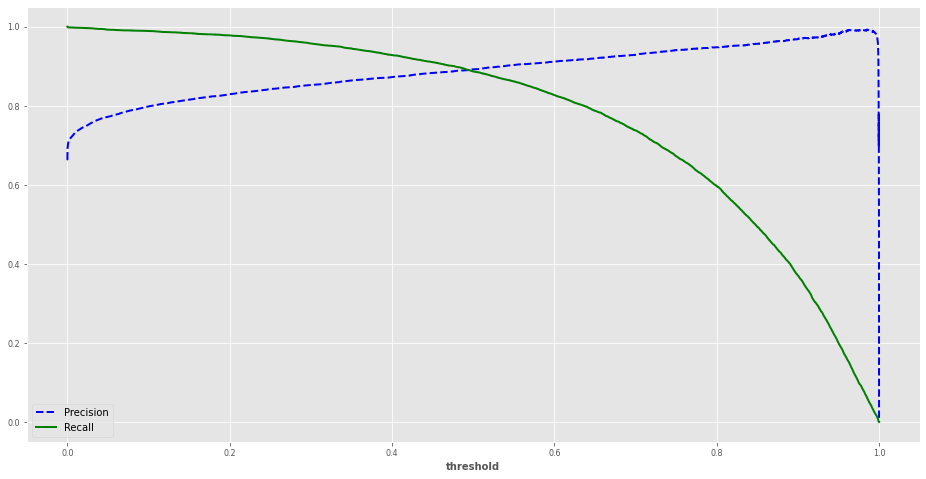

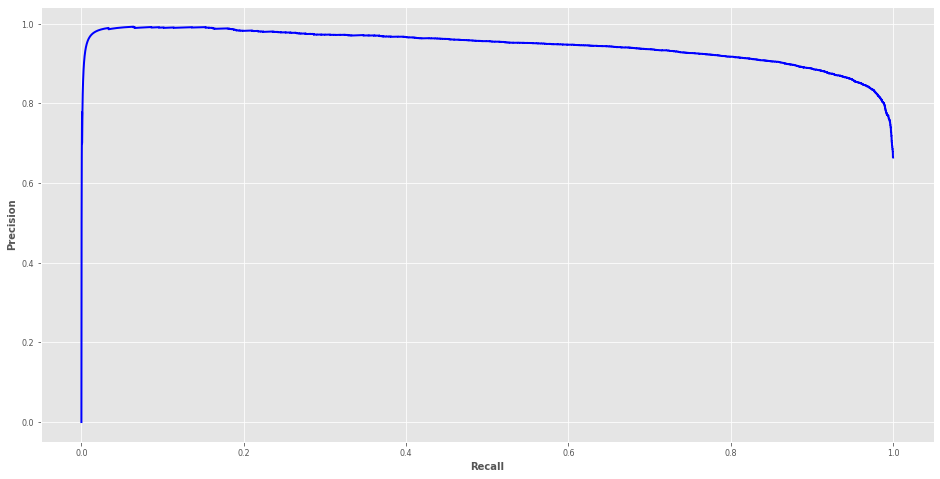

In [ ]:
#andamenti di precision e recall
precisions,recalls,thresholds=precision_recall_curve(y_train,y_score)
plot_precision_recall_vs_threshold(precisions, recalls, thresholds)
plt.show()

plot_decision_vs_recall(precisions, recalls, thresholds)
plt.show()

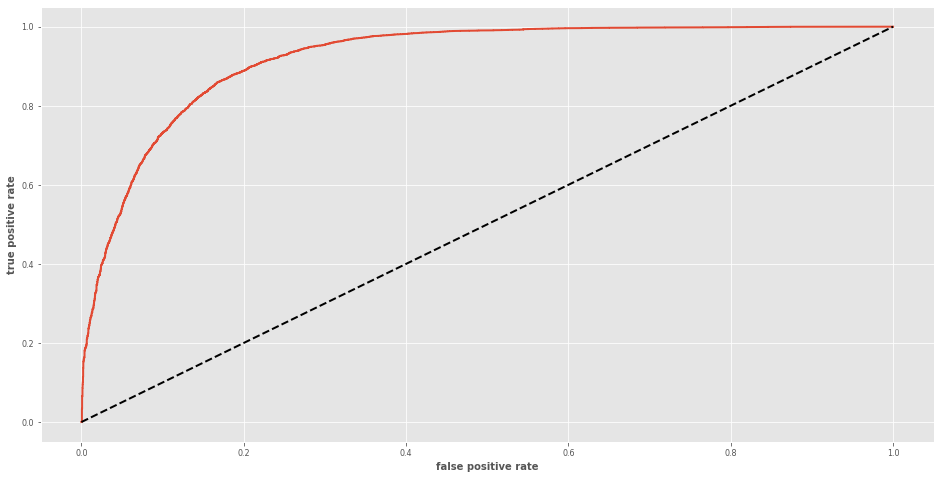

In [ ]:
fpr,tpr,thresholds=roc_curve(y_train,y_score)

plot_roc_curve(fpr,tpr)
plt.show()

Adesso possiamo valutare il modello sul test set

In [ ]:
threshold=0.7 #valore della threshold scelto come esempio per plottare la matrice di confusione
proba_test=logistic_model.predict_proba(X_test)[:,1]
predict_test=np.multiply(logistic_model.predict_proba(X_test)[:,1]>threshold,1) #vettore binario a seconda che la probabilità sia maggiore o minore di una threshold da scegliere
print(f'AUC_train:{roc_auc_score(y_test,proba_test)}')

AUC_train:0.9228079275686454


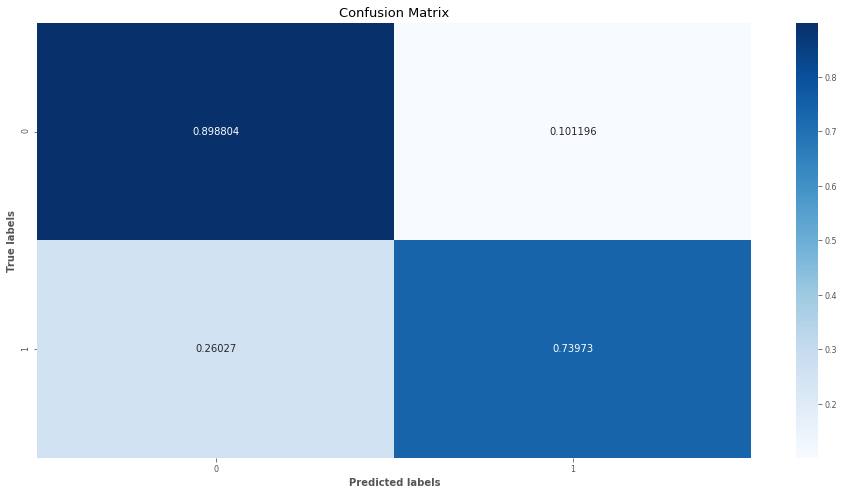

In [ ]:
ax= plt.subplot()
sns.heatmap(confusion_matrix(y_test,predict_test,normalize='true'), cmap=plt.cm.Blues, annot=True, fmt='g', ax=ax);  #annot=True to annotate cells, ftm='g' to disable scientific notation

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['0', '1']); ax.yaxis.set_ticklabels(['0', '1']);

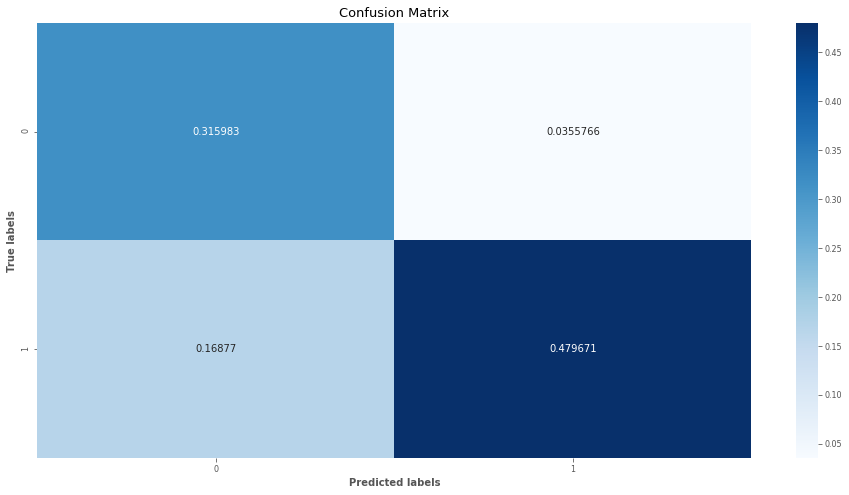

In [ ]:
ax= plt.subplot()
sns.heatmap(confusion_matrix(y_test,predict_test,normalize='all'), cmap=plt.cm.Blues, annot=True, fmt='g', ax=ax);  #annot=True to annotate cells, ftm='g' to disable scientific notation

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['0', '1']); ax.yaxis.set_ticklabels(['0', '1']);

# **SVM**

L'approccio dell'algoritmo *support vector machine* al problema della classificazione si basa sul concetto di *margine* definito come la distanza tra la superficie di decisione e il punto del dataset più vicino a quest'ultima. L'algoritmo ha come scopo quello di massimizzare questa distanza.

**HARD MARGIN CLASSIFIER**

**inserire immagine**

Geometricamente la distanza di un punto $\vec{x_n}$ dalla superficie di decisione è
$$\frac{t_ny(\vec{x_n})}{||\vec{w}||}=\frac{t_n(\vec{w}^T\phi(\vec{x_n})+b)}{||\vec{w}||}$$

e quindi massimizzare il margine singifica risolvere
$$ \arg\max_{\vec{w},b}\frac{1}{||\vec{w}||}\min_n[t_n(\vec{w}^T\phi(\vec{x_n})+b]$$

Moltiplicando $\vec{w}$ e b per un coefficiente k, il margine resta invariato, ovvero è definito a meno di un coefficiente costante. Questo grado di libertà può essere usato per porre $t_ny(\vec{x_n})=1$ per il punto più vicino alla superficie di decisione. Di conseguenza il problema precedente si riduce a trovare il massimo di $||\vec{w}||^{-1}$, che è equivalente a risolvere
$$\arg\min_{\vec{w},b} \frac{1}{2}||\vec{w}||^2$$
con la condizione: $t_n(\vec{w}^T\phi(\vec{x_n})+b)\geq 1 ,\forall n$.

Il problema appena definito è un esempio di *quadratic programming* problem ovvero è un problema con una funzione quadratica da ottimizzare con un vincolo lineare.

Introduciamo i moltiplicatori di Lagrange $a_n$ e la funzione lagrangiana
$$L(\vec{w},b,\vec{a})=\frac{1}{2}||\vec{w}||^2-\sum_{n=1}^{N}a_n[t_n(\vec{w}^T\phi(\vec{x_n})+b)-1]$$

allora avremo lo stesso ottimo del problema precedente risolvendo
$$\max_a\min_{\vec{w},b} L(\vec{w},b,\vec{a})$$

Imponendo uguali a zero le derivate della lagrangiana rispetto a $\vec{w}$ e $b$ troviamo le relazioni:
$$\vec{w}=\sum_{n=1}^{N}a_nt_n\phi(\vec{x_n})$$
$$0=\sum_{n=1}^{N}a_nt_n$$
che possiamo usare per eliminare $\vec{w}$ e $b$ dalla lagrangiana ottenendo così il seguente problema
$$L(\vec{a})=\sum_{n=1}^{N}a_n-\frac{1}{2}\sum_{n=1}^{N}\sum_{m=1}^{N}a_na_mt_nt_mk(\vec{x_n},\vec{x_m})$$ soggetto ai vincoli
$$a_n\geq0, \forall n$$ $$\sum_{n=1}^{N}a_nt_n=0$$
Tale formulazione è detta **rappresentazione duale** del problema.

Grazie ai valori ottimali di $\vec{w}$ trovati possiamo riscrivere la funzione discriminante come segue $$y(\vec{x})=\sum_{n=1}^{N}a_nt_nk(\vec{x_n},\vec{x_m})+b$$

VANTAGGIO DEL PROBLEMA DUALE

Un problema di ottimizzazione inizialmente definito soddisfa le *relazioni di Karush-Kuhn-Tucker*:
$$a_n\geq0$$ $$t_ny(\vec{x_n})-1\geq0$$ $$a_n[t_ny(\vec{x_n})-1]=0$$

Le prime due condizioni non aggiungono nulla di nuovo a quanto già sappiamo. La terza condizione però ci dice che i moltiplicatori di Lagrange sono nulli per tutti i punti del dataset che non sono punti attivi. Questo fa si che il numero di parametri da determinare nel problema duale è in realtà molto minore di N.

**SOFT MARGIN CLASSIFIER**
$$t_ny(\vec{x_n})\geq1-\xi_n, \forall n$$ 

$$\arg\min_{\vec{w},b} C\sum_{n=1}^{N}\xi_n+\frac{1}{2}||\vec{w}||^2$$






In [ ]:
#divisione in training set e test set
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3,random_state=42,stratify=y)

# addestriamo il modello
rbf_kernel_svm_clf=Pipeline([
                             ('scaler',StandardScaler()),
                             ('svm_clf', SVC(kernel='rbf',class_weight='balanced',probability=True))
                             ])
rbf_kernel_svm_clf.fit(X_train,y_train)

Pipeline(memory=None,
         steps=[('scaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('svm_clf',
                 SVC(C=1.0, break_ties=False, cache_size=200,
                     class_weight='balanced', coef0=0.0,
                     decision_function_shape='ovr', degree=3, gamma='scale',
                     kernel='rbf', max_iter=-1, probability=True,
                     random_state=None, shrinking=True, tol=0.001,
                     verbose=False))],
         verbose=False)

**TRUCCO KERNEL**

Le funzioni kernel concettualmente fanno la stessa cosa delle funzioni base, ma senza applicare davvero una trasformazione alle features. Questo permette di avere un notevole vantaggio dal punto di vista computazionale sopratutto quando il numero di features è elevato.


ESEMPIO DI UNA FUNZIONE KERNEL POLINOMIALE


Prendiamo una funzione base del secondo ordine che opera nel modo seguente
$$\phi(\vec{x})=\phi\bigg(\bigg(x1,x2\bigg)^T\bigg)=\bigg(x_{1}^{2},\sqrt{2}x_1x_2,x_2^2\bigg)^T$$
Allora
$$\phi(\vec{a})^T\phi(\vec{b})=(a_1b_1+a_2b_2)^2=\bigg((a_1,a_2)^T(b_1,b_2)\bigg)^2=(\vec{a}^T\vec{b})^2\equiv k(\vec{a},\vec{b})$$
Utilizzando un kernel come quello appena definito possiamo riprodurre il prodotto scalare delle funzioni plonimiali quadratiche $\phi$ senza davvero applicare tali funzioni.




La funzione kernel da noi utilizzata è la *Gaussian RBF* (radial basis function) $$K(\vec{a},\vec{b})=exp(-\gamma||\vec{a}-\vec{b}||^2)$$

Valutiamo il modello sul training set

In [ ]:
predict_train=rbf_kernel_svm_clf.predict(X_train)
proba_train=rbf_kernel_svm_clf.predict_proba(X_train)[:,1]

print(f'AUC_train:{roc_auc_score(y_train,proba_train)}')

AUC_train:0.9233722835349547


Valutiamo il modello con la cross-validation

In [ ]:
#Stratifiedkfold
skfolds=StratifiedKFold(n_splits=5,shuffle=True,random_state=42)
scores=cross_val_score(rbf_kernel_svm_clf,X_train,y_train,cv=skfolds,scoring='roc_auc')
display_scores(scores)

scores: [0.92451772 0.91409007 0.9183039  0.91654166 0.90988378]
mean: 0.9166674242701778
Standard deviation: 0.004836973189246186


Cerchiamo, se c'è, un modello migliore modificando i parametri C e $\gamma$

In [ ]:
param_grid=[
    {'C': list(np.linspace(1,10,10)), 'gamma': list(np.linspace(0.01,1,10)) }
]


svm_clf=SVC(kernel='rbf',class_weight='balanced',probability=True)
grid_search=GridSearchCV(svm_clf,param_grid,cv=5,scoring='roc_auc',return_train_score=True)

sc=StandardScaler() #mean=0, variance=1
X_train=sc.fit_transform(X_train)
#X_val=sc.transform(X_val)
#X_test=sc.transform(X_test)

grid_search.fit(X_train,y_train)
grid_search.best_params_

{'C': 10.0, 'gamma': 0.12}

Valutiamo il miglior modello sul training set

In [ ]:
best_SVM=grid_search.best_estimator_ #il miglior modello trovato tramite Grid_Search
predict_train=best_SVM.predict(X_train)
proba_train=best_SVM.predict_proba(X_train)[:,1]
print(f'AUC_train:{roc_auc_score(y_train,proba_train)}')

AUC_train:0.9413276359801246


Valutiamo il miglior modello con la cross-validation

In [ ]:
y_score=cross_val_predict(best_SVM,X_train,y_train,cv=5,method='predict_proba')[:,1]
print(y_score[:20]) #printiamo i primi 20 risultati
scores=cross_val_score(best_SVM,X_train,y_train,cv=5,scoring='roc_auc')
display_scores(scores)

[9.54358066e-01 9.39215533e-01 7.36189964e-01 8.57584432e-01
 9.69258994e-01 1.20213437e-04 9.64738297e-01 9.19703560e-01
 1.03897462e-02 9.61344989e-01 1.05480380e-02 2.93844773e-03
 9.77468887e-01 8.96531119e-01 9.42240559e-01 9.34848886e-01
 2.03278320e-02 9.75149525e-01 4.08140247e-01 9.81515609e-01]
scores: [0.93426116 0.91372879 0.93038605 0.91956529 0.92181233]
mean: 0.923950721668142
Standard deviation: 0.0074298205946967365


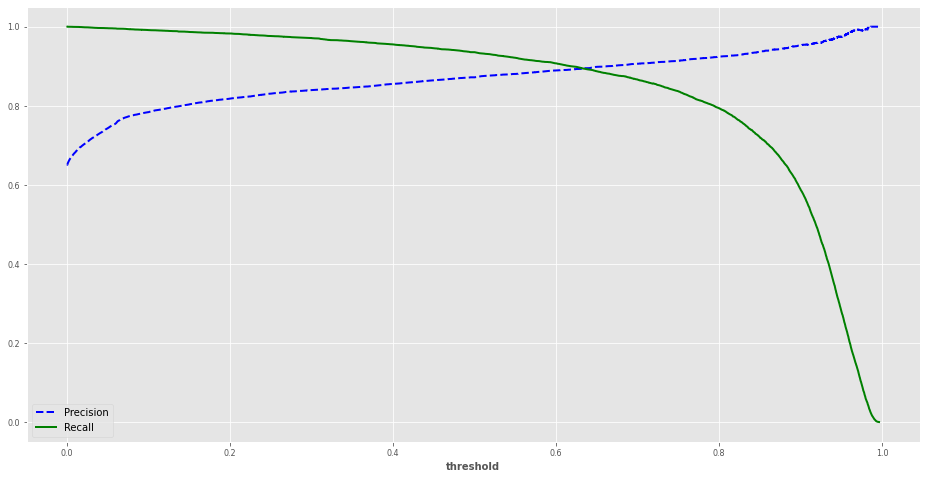

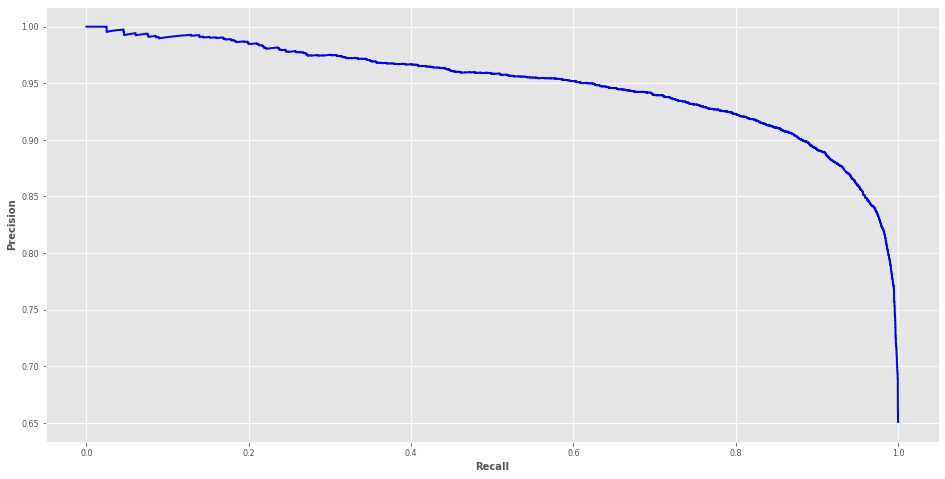

In [ ]:
#andamenti di precision e recall
precisions,recalls,thresholds=precision_recall_curve(y_train,y_score)
plot_precision_recall_vs_threshold(precisions, recalls, thresholds)
plt.show()

plot_decision_vs_recall(precisions, recalls, thresholds)
plt.show()

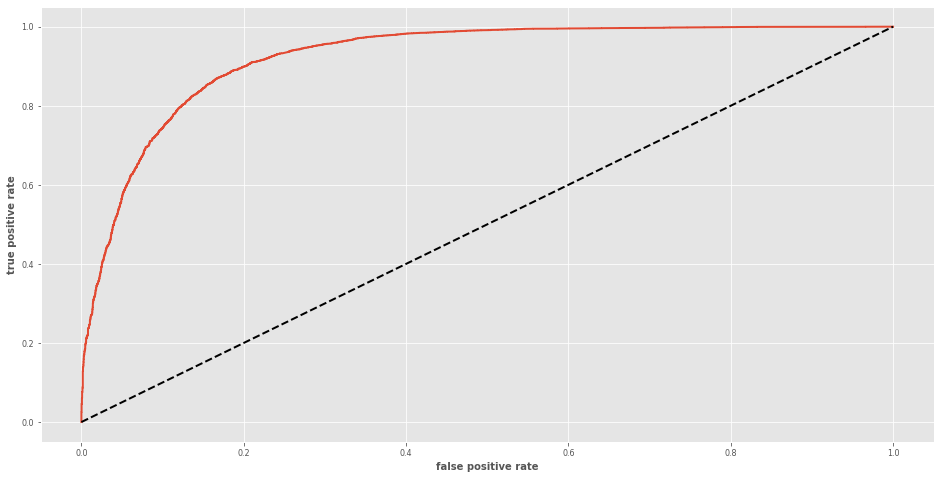

In [ ]:
fpr,tpr,thresholds=roc_curve(y_train,y_score)

plot_roc_curve(fpr,tpr)
plt.show()

Valutazione del modello sul test set

In [ ]:
X_test=sc.transform(X_test) #il modello istanziato non trasforma il dataset, dobbiamo farlo a mano
threshold=0.7 #valore della threshold scelto come esempio per plottare la matrice di confusione
proba_test=best_SVM.predict_proba(X_test)[:,1]
predict_test=np.multiply(best_SVM.predict_proba(X_test)[:,1]>threshold,1) #vettore binario a seconda che la probabilità sia maggiore o minore di una threshold da scegliere
print(f'AUC_train:{roc_auc_score(y_test,proba_test)}')

AUC_train:0.9268662930128532


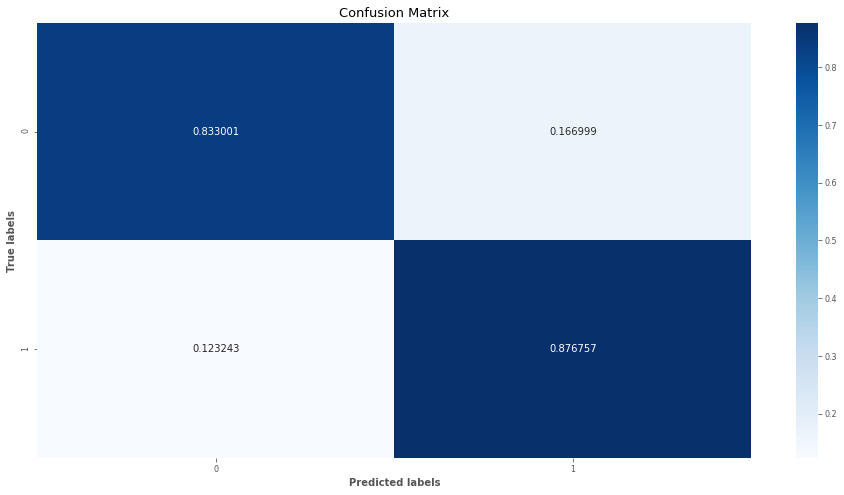

In [ ]:
ax= plt.subplot()
sns.heatmap(confusion_matrix(y_test,predict_test,normalize='true'), cmap=plt.cm.Blues, annot=True, fmt='g', ax=ax);  #annot=True to annotate cells, ftm='g' to disable scientific notation

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['0', '1']); ax.yaxis.set_ticklabels(['0', '1']);

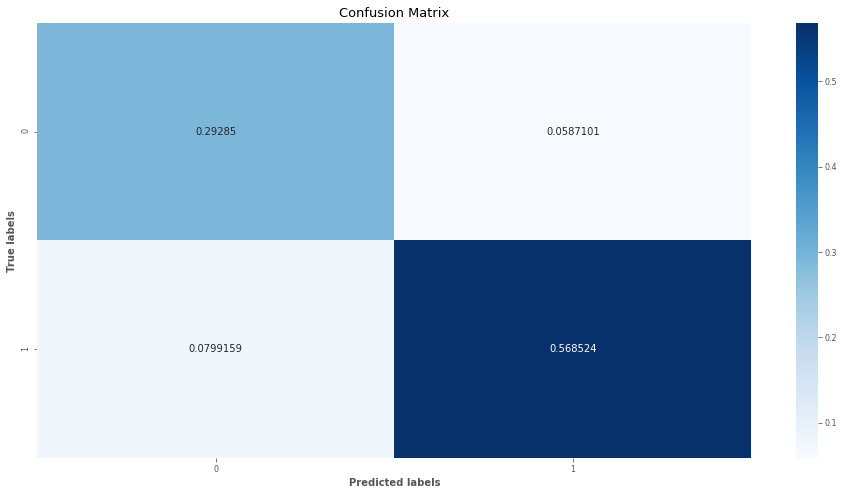

In [ ]:
ax= plt.subplot()
sns.heatmap(confusion_matrix(y_test,predict_test,normalize='all'), cmap=plt.cm.Blues, annot=True, fmt='g', ax=ax);  #annot=True to annotate cells, ftm='g' to disable scientific notation

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['0', '1']); ax.yaxis.set_ticklabels(['0', '1']);

# **Decision Tree**

Il Decision Tree è un algoritymo di machine learning non parametrico.

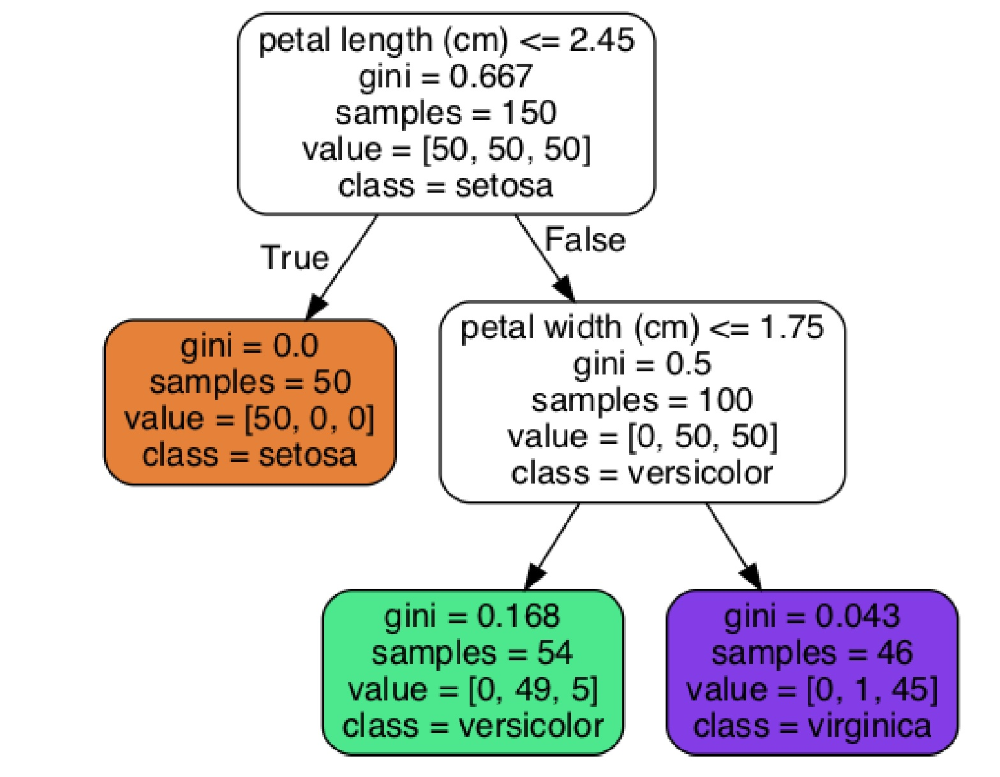



Il decision tree è formato da nodi (i rettangoli in figura). I nodi che hanno una features su cui dividersi sono chiamati nodi interni. Il primo nodo interno in alto è chiamato radice. I nodi finali in cui facciamo le previsioni della classe sono chiamati nodi foglia. I nodi interni hanno tutti dei nodi sotto di loro, che chiamiamo nodi figlio.

Quando costruiamo il decision tree, non scegliamo casualmente su quale features fare lo split per prima. Vogliamo iniziare scegliendo la funzione con più potere predittivo.

Per determinare su quale feature e soglia dovremmo effettuare lo split, dobbiamo assegnare uno score a ogni possibile divisione in modo da poter scegliere la divisione con lo score più alto. Il nostro obiettivo sarebbe quello di dividere perfettamente i dati. Quindi selezioniamo la feature e la soglia con la misurà di impurità minima. Un nodo foglia è puro (ovvero ha impurtà minima) quando tutti i suoi elementi appartengono alla stessa classe.

#Misura di impurità

Sia data una variabile casuale discreta, con dominio $\lbrace a_1 ,..., a_k \rbrace$, con distribuzione di probabilità, sul dominio, data dall'insieme $p= \left( p_1 ,..., p_k \right)$. Allora, una misura di impurità $\phi : p \rightarrow \mathbb{R}$ ha le seguenti proprietà:

1) $\phi (p) \geq 0$ per tutti i possibili valori di p

2) $\phi (p)$ è minima se esiste $\textit{i}$, con $1 \leq i \leq k$, tale che $p_i =1$

3) $\phi (p)$ è massima se $p_i = \frac{1}{k}$ per ogni i

4) $\phi (p) = \phi (p^{\prime})$ per ogni $p^{\prime}$ derivanti da una permutazione di $p$

5) $\phi (p)$ è differenziabile ovunque

Nel nostro caso consideriamo la classe di ogni elemento in $S$, dove $S$ è l'insieme degli elemeti della regione che stiamo considerando.

Per ogni insieme di elementi $S$, il vettore di probabilità associato ad $S$ può essere definito come $p= \left( \frac{\vert S_1 \vert}{\vert S \vert} ,..., \frac{\vert S_k \vert}{\vert S \vert} \right)$, dove $S_h \subseteq S $ è l'insieme di elementi di $S$ appartenenti alla classe $h$.

Data una funzione $f : S \rightarrow \lbrace 1 ,..., r \rbrace$, sia $s_i = \left\lbrace x \in S \vert f(x) = i \right\rbrace $. Allora la qualità dello split di $S$ rispetto a $r$ è data da:
$$\Delta_{\phi} \left( S,f \right) = \phi (p_S) - \sum_{i=1}^{r} p_i \hspace{1mm} \phi (p_{s_i})$$

In questo codice, per calcolare la purezza useremo due tipi di misura: l'indice di gini e l'entropia.

#Entropia
Per ogni insieme $S$ di elementi, definiamo
$$ H_s = -\sum_{i=1}^{k} \frac{\vert S_i \vert}{\vert S \vert} \hspace{1mm} log_2 \left( \frac{\vert S_i \vert}{\vert S \vert} \right) $$
l'entropia di $S$.

L'information gain rispetto a una funzione di partizione $f$ è la diminuzione dell'entropia da $S$ alla somma dell'entropia di $s_i$ (pesata dalla probabilità associata)
$$ IG(S, f) = H_S - \sum_{j=1}^{r} \frac{\vert s_j \vert}{\vert S \vert} H_{s_j}$$

#Indice di Gini

L'indice di Gini è una misura di quanto sia puro un insieme.

L'indice di Gini è definito come
$$ G_S = 1 - \sum_{i=1}^{k} \left( \frac{\vert S_i \vert}{\vert S \vert} \right)^2$$

Usando l'indice di Gini come misura dell'impurità, la bontà dello split è data dal Gini gain, definito come segue.

Il Gini gain rispetto a una funzione di partizione $f$ è la diminuzione dell'indice di Gini da $S$ alla somma pesata dell'indice di Gini di $s_i$
$$ GG(S, f) = G_S - \sum_{j=1}^{r} \frac{\vert s_j \vert}{\vert S \vert} G_{s_j} $$

#Pruning

I decision tree sono incredibilmente inclini all'overfitting. Poiché possono continuare ad avere nodi aggiuntivi nell'albero, il modello può davvero scavare a fondo nelle specifiche del training set. A seconda dei dati, ciò potrebbe comportare un modello che non cattura la vera natura dei dati e non generalizza.

Per risolvere questi problemi, facciamo ciò che viene chiamato pruning the tree.

Esistono due tipi di pruning: pre-pruning e post-pruning. Nel pre-pruning, abbiamo delle regole su quando smettere di costruire l'albero, quindi smettiamo di costruire prima che l'albero sia troppo grande. Nel post-pruning costruiamo l'intero albero, poi lo esaminiamo e decidiamo quali foglie rimuovere per rimpicciolirlo.

Ci concentreremo sulle tecniche di pre-pruning. Abbiamo alcune opzioni su come limitare la crescita degli alberi. Ecco alcune tecniche di pre-pruning utilizzate:

• 𝐌𝐚𝐱 𝐝𝐞𝐩𝐭𝐡 : far crescere l'albero solo fino a una certa profondità (o altezza dell'albero)

• 𝐋𝐞𝐚𝐟 𝐬𝐢𝐳𝐞 : non dividere un nodo se il numero di elementi in quel nodo è inferiore a una soglia

• 𝐍𝐮𝐦𝐛𝐞𝐫 𝐨𝐟 𝐥𝐞𝐚𝐟 𝐧𝐨𝐝𝐞𝐬 : limita il numero totale di nodi foglia consentiti nell'albero

#Vantaggi e svantaggi del decision tree

**Computazione**: un decision tree è molto costoso dal punto di vista computazionale da costruire.

La previsione con un decision tree, d'altra parte, è molto economica dal punto di vista computazionale. Devi solo porre una serie di domande sì/no sul datapoint per arrivare alla previsione.

**Performance**: i decision tree possono funzionare discretamente bene a seconda dei dati, sebbene siano inclini all'overfitting.
Per porre rimedio ai problemi di overfitting, i decision tree generalmente richiedono un processo di tuning per ottenere il miglior modello possibile.

I decision tree spesso richiedono lavoro per essere alla pari con le prestazioni di altri modelli senza ottimizzazione.

**Interpretability**: I decision tree sono facilmente interpretabili.

In [ ]:
dt_clf = DecisionTreeClassifier(class_weight='balanced', random_state=42)

#divisione in training set e test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

dt_clf.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight='balanced', criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=42, splitter='best')

Valutiamo il modello con la cross-validation

In [ ]:
criterio=['gini', 'entropy']
for crit in criterio:
    dt_1 = DecisionTreeClassifier(criterion=crit, class_weight='balanced', random_state=42)
    dt_1.fit(X_train, y_train)
    cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=42)
    print('AUC %s:' %(crit))
    print(cross_val_score(dt_1, X_train, y_train, cv=cv, scoring='roc_auc', n_jobs=-1))

AUC gini:
[0.79623835 0.79142664 0.79559187 0.78429407 0.80369178 0.79042353
 0.7757762  0.80076017 0.79615579 0.78468694 0.78844174 0.7874875
 0.79214623 0.80749903 0.80136376]
AUC entropy:
[0.80629822 0.80622894 0.78065026 0.7837147  0.79705559 0.79322902
 0.79934976 0.79964718 0.79725363 0.78713195 0.79048879 0.79182627
 0.78135175 0.80786477 0.80723178]


Cerchiamo i parametri ottimali

In [ ]:
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [10, 15, 30],
    'min_samples_leaf': [20, 50, 200],
    'max_leaf_nodes': [100, 300, 800]}

dt = DecisionTreeClassifier(class_weight='balanced', random_state=42)
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=42)
gs = GridSearchCV(dt, param_grid, scoring='roc_auc', cv=cv, n_jobs=-1)

gs.fit(X_train, y_train)

GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=3, n_splits=5, random_state=42),
             error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=42,
                                              splitter='bes

In [ ]:
print("best params:", gs.best_params_)
print("best score:", gs.best_score_)

best params: {'criterion': 'entropy', 'max_depth': 15, 'max_leaf_nodes': 100, 'min_samples_leaf': 20}
best score: 0.8941439936720516


In [ ]:
gs.best_estimator_

DecisionTreeClassifier(ccp_alpha=0.0, class_weight='balanced',
                       criterion='entropy', max_depth=15, max_features=None,
                       max_leaf_nodes=100, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=20,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       presort='deprecated', random_state=42, splitter='best')

Valutiamo il miglior modello sul training set

In [ ]:
best_dt= gs.best_estimator_ #il miglior modello trovato tramite Grid_Search

y_score = cross_val_predict(best_dt,X_train,y_train,cv=5, method='predict_proba')[:, 1]
print(y_score[:20]) #printiamo i primi 20 risultati
scores=cross_val_score(best_dt,X_train,y_train,cv=5,scoring='roc_auc')
display_scores(scores)

[0.98776845 0.54967881 0.20337557 0.72884061 0.98776845 0.01738288
 0.98776845 0.85691462 0.         1.         0.0026266  0.01338115
 1.         0.52038619 0.83545309 0.40844555 0.01850274 0.98776845
 0.17145501 0.98776845]
scores: [0.89976628 0.87691838 0.88618171 0.8906312  0.886663  ]
mean: 0.8880321136860305
Standard deviation: 0.007392693689806665


Precision, recall e curva ROC

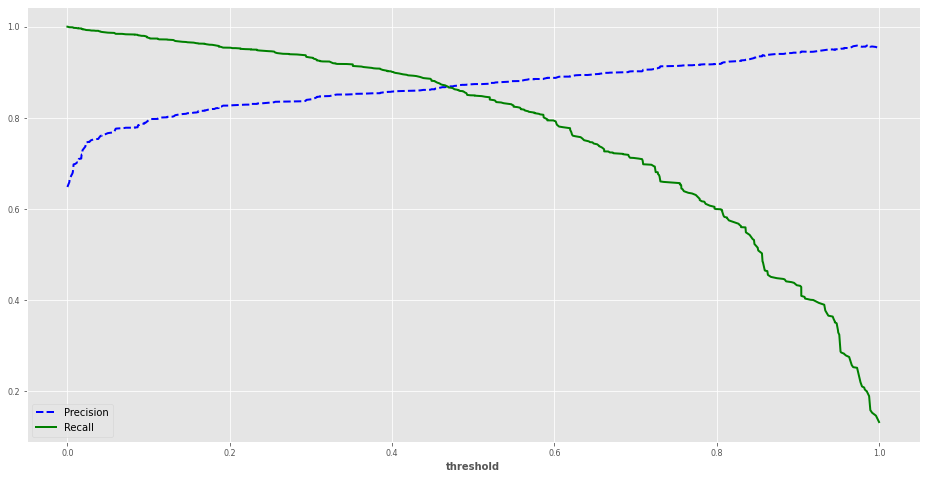

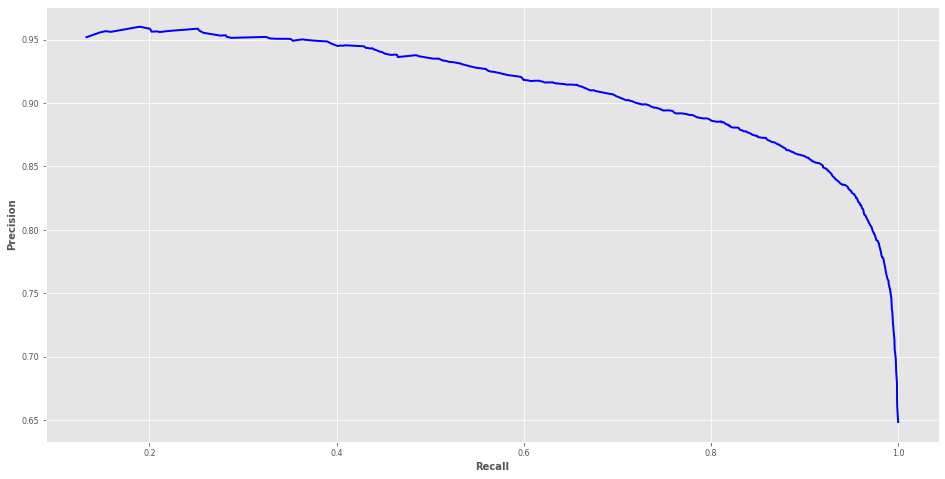

In [ ]:
#andamenti di precision e recall
precisions,recalls,thresholds=precision_recall_curve(y_train,y_score)
plot_precision_recall_vs_threshold(precisions, recalls, thresholds)
plt.show()

plot_decision_vs_recall(precisions, recalls, thresholds)
plt.show()

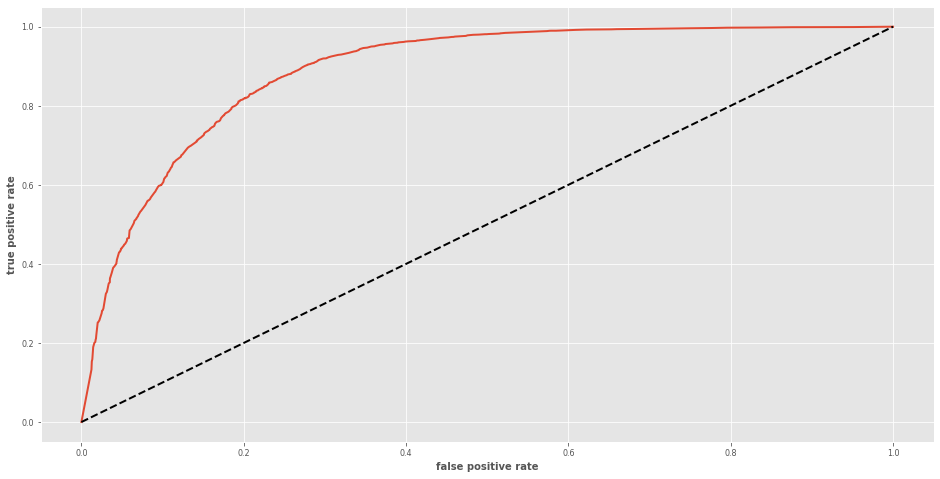

In [ ]:
fpr,tpr,thresholds=roc_curve(y_train,y_score)

plot_roc_curve(fpr,tpr)
plt.show()

Valutiamo l'algoritmo sul test set

In [ ]:
threshold=0.7 #valore della threshold scelto come esempio per plottare la matrice di confusione
y_pred_test=best_dt.predict_proba(X_test)[:,1]
print(f'AUC_test:{roc_auc_score(y_test,y_pred_test)}')

AUC_test:0.8940747352536984


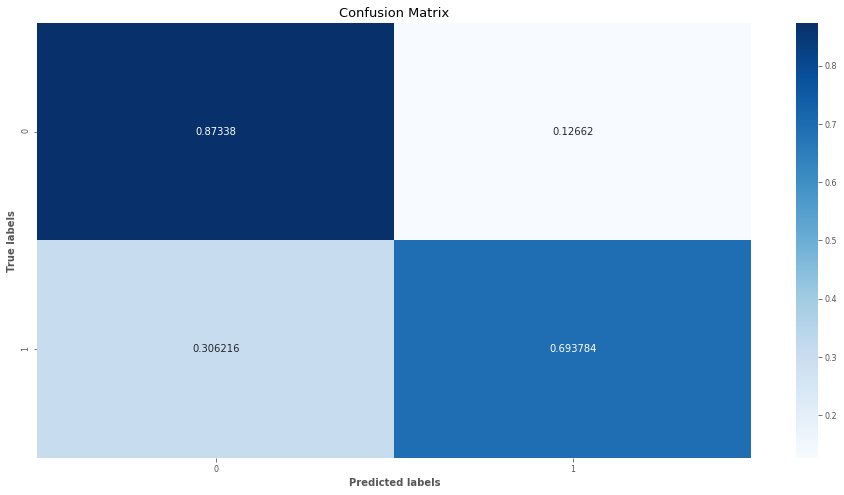

In [ ]:
y_dt_th= y_pred_test > threshold

ax= plt.subplot()
sns.heatmap(confusion_matrix(y_test,y_dt_th,normalize='true'), cmap=plt.cm.Blues, annot=True, fmt='g', ax=ax);  #annot=True to annotate cells, ftm='g' to disable scientific notation

ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['0', '1']); ax.yaxis.set_ticklabels(['0', '1']);

Plottiamo l'albero

In [ ]:
#salviamo in locale l'immagine dell'albero
dot_file = tree.export_graphviz(best_dt,
                     feature_names = dataset.columns[:-1],
                     filled = True)
graph = graphviz.Source(dot_file)
graph.render(filename='tree', format='jpg', cleanup=True, view=True) #view=‘True’ apre il file jpg

'tree.jpg'

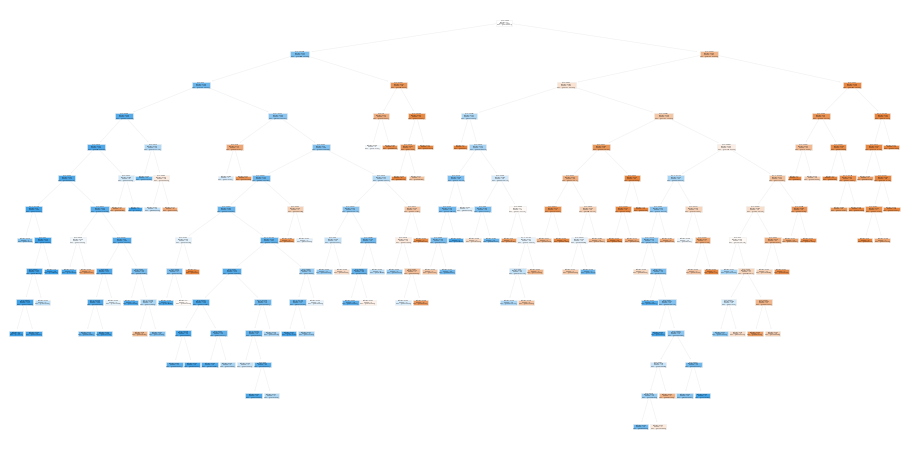

In [ ]:
tree.plot_tree(best_dt,feature_names = dataset.columns[:-1],filled = True); #è meglio l'immagine salvata in locale

# **Random Forest**

Il Random Forest è un esempio di ensamble perché usa più modelli di machine learning per costruire un singolo modello.

I decision trees hanno una varianza molto alta.

Il random forest prende i vantaggi del decision tree diminuendo la varianza.

Vediamo su cosa si basa questo modello.

#Metodi ensemble

Nei metodi ensemble viene usato un insieme di classificatori detti weak learners.

Ci sono due metodi per combinare insieme i vari modelli:

1) **bagging**: si allena un comitato di $L$ diversi modelli e si effettua la predizione con ognuno dei modelli. Successivamente si combinano le $L$ predizioni, dei vari modelli, tipicamente o con una media (regressione) o per votazione (classificazione).

2) **boosting**: i modelli sono istanziati in maniera non indipendente l'uno dall'altro. Il modo in cui viene instanziato l'i-esimo modello dipende dall'efficacia del (i-1)-esimo modello. Si ha un addestramento sequenziale. La predizione viene fatta combinando insieme le relative predizioni.

#Bagging

Il bagging usa tipacamente classificatori con elevata varianza.

Il bagging può essere visto come un metodo finalizzato a diminuire la varianza della classificazione adottata.

Il bagging fa riferimento al metodo di **bootstrap**.

Il bootstrap è una tecnica di resampling usata in statistica. 

Un bootstrapped sample è un campione casuale di dati, dove i dati vengono selezionati casualmente, con replacement, dal dataset di partenza per creare, nel nostro caso, un dataset della stessa dimensione. La selezione casuale con replacement significa che possiamo scegliere lo stesso dato più volte.

Dato un training set il bagging media le predizioni fatte da classificatori, dello stesso tipo, su una collezione di bootstrapped samples. Alla fine, per classificare un input $x$, si prende la classe con più voti tra tutti i classificatori. Nel caso della regressione, il valore predetto è dato dalla media delle predizioni.

Il random forest è un'applicazione del bagging a un insieme (random) di decision trees.

In un decision tree di una random forest, in ogni nodo, selezioniamo casualmente un sottoinsieme delle features da considerare. Questo ci porterà a scegliere una feature buona, ma non la migliore, su cui splittare ad ogni passaggio.

Una scelta standard per il numero di features da considerare ad ogni suddivisione è la radice del numero di features.

In [ ]:
rf_clf = RandomForestClassifier(class_weight='balanced', random_state=42)

#divisione in training set e test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

rf_clf.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight='balanced',
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

Valutiamo il modello con la cross-validation

In [ ]:
criterio=['gini', 'entropy']
for crit in criterio:
    rf_1 = RandomForestClassifier(criterion=crit, class_weight='balanced', random_state=42)
    rf_1.fit(X_train, y_train)
    cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=42)
    print('AUC %s:' %(crit))
    print(cross_val_score(rf_1, X_train, y_train, cv=cv, scoring='roc_auc', n_jobs=-1))

AUC gini:
[0.93739143 0.92758613 0.92859011 0.93271251 0.92824641 0.92878874
 0.92275926 0.9406027  0.9321523  0.93179323 0.93090508 0.92791276
 0.92995909 0.93434614 0.93364958]
AUC entropy:
[0.94038344 0.92959482 0.92940569 0.93274621 0.92722415 0.92815743
 0.91968559 0.94053932 0.93058051 0.93044476 0.93143649 0.92674355
 0.93282783 0.93394917 0.93302192]


Cerchiamo i parametri ottimali

In [ ]:
n_estimators = list(range(90, 101))

param_grid = {
    'criterion': ['gini', 'entropy'],
    'n_estimators': n_estimators}

rf = RandomForestClassifier(class_weight='balanced', random_state=42)
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=42)
gs_rf = GridSearchCV(rf, param_grid, scoring='roc_auc', cv=cv, n_jobs=-1)

gs_rf.fit(X_train, y_train)

GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=3, n_splits=5, random_state=42),
             error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                               

In [ ]:
print("best params:", gs_rf.best_params_)
print("best score:", gs_rf.best_score_)
gs_rf.best_estimator_

best params: {'criterion': 'gini', 'n_estimators': 99}
best score: 0.9311753074590243


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight='balanced',
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=99,
                       n_jobs=None, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

Valutiamo il miglior modello sul training set

In [ ]:
best_rf= gs_rf.best_estimator_ #il miglior modello trovato tramite Grid_Search

y_score_rf = cross_val_predict(best_rf,X_train,y_train,cv=5, method='predict_proba')[:, 1]
print(y_score_rf[:20]) #printiamo i primi 20 risultati
scores_rf=cross_val_score(best_rf,X_train,y_train,cv=5,scoring='roc_auc')
display_scores(scores_rf)

[0.97979798 0.88888889 0.43434343 0.8989899  1.         0.04040404
 0.98989899 0.98989899 0.09090909 0.97979798 0.         0.07070707
 1.         0.80808081 0.93939394 0.88888889 0.02020202 1.
 0.29292929 0.98989899]
scores: [0.93932001 0.91803075 0.92976772 0.93073448 0.92992759]
mean: 0.9295561092912443
Standard deviation: 0.006778481870860236


Precision, recall e curva ROC

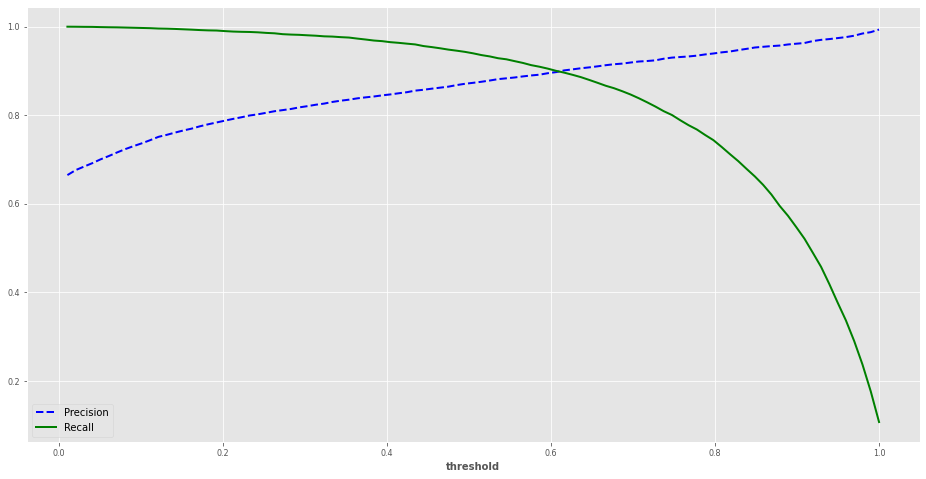

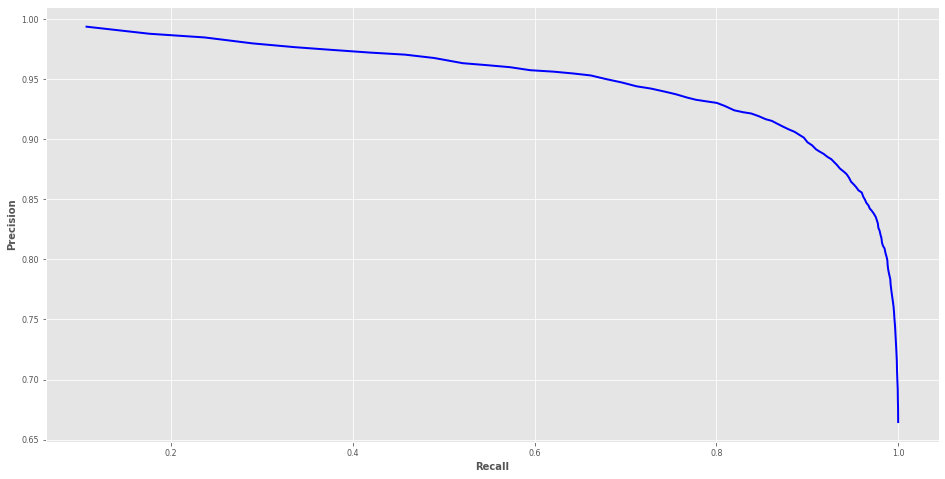

In [ ]:
#andamenti di precision e recall
precisions,recalls,thresholds = precision_recall_curve(y_train,y_score_rf)
plot_precision_recall_vs_threshold(precisions, recalls, thresholds)
plt.show()
 
plot_decision_vs_recall(precisions, recalls, thresholds)
plt.show()

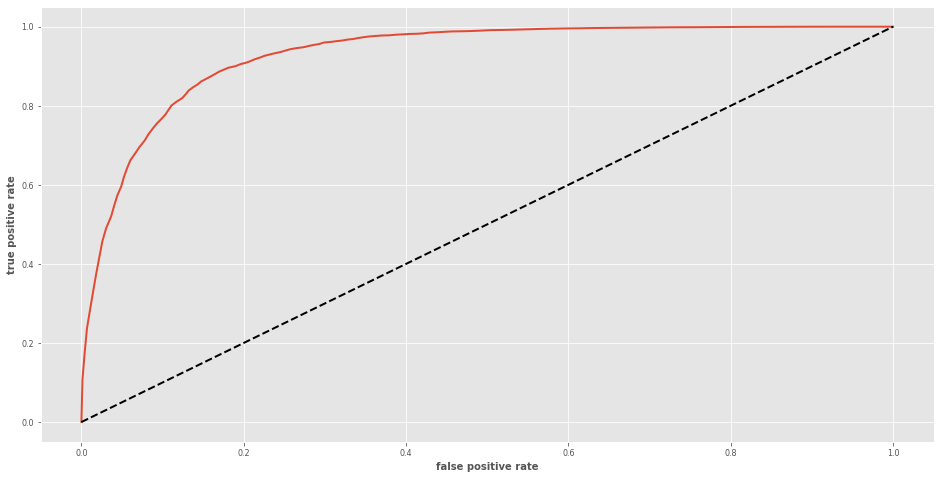

In [ ]:
fpr,tpr,thresholds=roc_curve(y_train,y_score_rf)

plot_roc_curve(fpr,tpr)
plt.show()

Valutiamo l'algoritmo sul test set

In [ ]:
threshold=0.8 #valore della threshold scelto come esempio per plottare la matrice di confusione
y_pred_test_rf=best_rf.predict_proba(X_test)[:,1]
print(f'AUC_test:{roc_auc_score(y_test,y_pred_test_rf)}')

AUC_test:0.9353360189701168


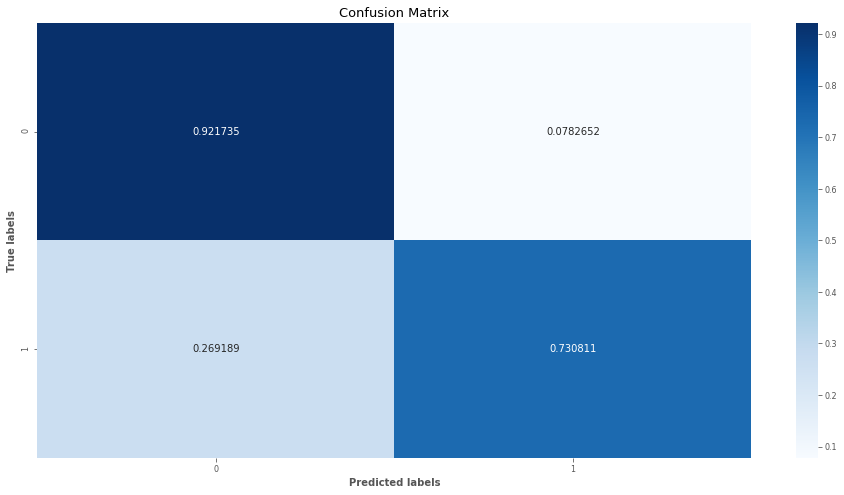

In [ ]:
y_rf_th= y_pred_test_rf > threshold

ax= plt.subplot()
sns.heatmap(confusion_matrix(y_test,y_rf_th,normalize='true'), cmap=plt.cm.Blues, annot=True, fmt='g', ax=ax);  #annot=True to annotate cells, ftm='g' to disable scientific notation

ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['0', '1']); ax.yaxis.set_ticklabels(['0', '1']);

#Feature Importances

Le random forests forniscono un metodo semplice per la feature selection: diminuzione media dell'impurezza. Ricordiamo che una random forest è composta da molti decision trees e che, per ogni albero, lo split del dataset viene scelto in base alla diminuzione massima dell'impurità. Quindi si può calcolare quanta impurezza diminuisce ogni feature in un albero e poi, per una random forest, è possibile calcolare la media della diminuzione dell'impurità da ciascuna feature. Questa misura si può considerare come una metrica di importanza di ogni feature: Si può quindi classificare e selezionare le feature a seconda della feature importance.

In [ ]:
ft_imp = pd.Series(best_rf.feature_importances_, index=dataset.columns[:-1]).sort_values(ascending=False)
print(ft_imp.head(10))

C9     0.264637
C1     0.137290
C2     0.115189
C3     0.110245
C7     0.083652
C10    0.067007
C4     0.062968
C5     0.060177
C8     0.050093
C6     0.048742
dtype: float64


Ora proviamo a costruire un nuovo modello di random forest usando solo le prime 6 features più importanti.

In [ ]:
X = dataset[['C1', 'C2', 'C3', 'C7', 'C9', 'C10']].values

rf_new = RandomForestClassifier(class_weight='balanced', random_state=42)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)
rf_new.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight='balanced',
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

Valutiamo il modello con la cross-validation

In [ ]:
criterio=['gini', 'entropy']
for crit in criterio:
    rf_new_1 = RandomForestClassifier(criterion=crit, class_weight='balanced', random_state=42)
    rf_new_1.fit(X_train, y_train)
    cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=42)
    print('AUC %s:' %(crit))
    print(cross_val_score(rf_new_1, X_train, y_train, cv=cv, scoring='roc_auc', n_jobs=-1))

AUC gini:
[0.92051249 0.92855574 0.92691681 0.92732631 0.92118684 0.91966136
 0.92387811 0.92350331 0.93375894 0.92069248 0.92225407 0.92717549
 0.91506351 0.92433403 0.93495233]
AUC entropy:
[0.92020267 0.92687684 0.92670124 0.92888905 0.92015404 0.9209758
 0.92174102 0.92280658 0.93472593 0.91986309 0.92176308 0.92815167
 0.91380189 0.92568265 0.9357814 ]


Cerchiamo i parametri ottimali

In [ ]:
n_estimators = [80, 90, 100]

param_grid = {
    'criterion': ['gini','entropy'],
    'n_estimators': n_estimators}

rf_new_1 = RandomForestClassifier(class_weight='balanced',random_state=42)
gs_rf_new = GridSearchCV(rf_new_1, param_grid, scoring='roc_auc', cv=cv, n_jobs=-1)

gs_rf_new.fit(X_train, y_train)

GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=3, n_splits=5, random_state=42),
             error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                               

In [ ]:
print("best params:", gs_rf_new.best_params_)
print("best score:", gs_rf_new.best_score_)
gs_rf_new.best_estimator_

best params: {'criterion': 'gini', 'n_estimators': 100}
best score: 0.9246514544762453


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight='balanced',
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

In [ ]:
best_rf_new= gs_rf_new.best_estimator_ #il miglior modello trovato tramite Grid_Search

y_score_rf_new = cross_val_predict(best_rf_new,X_train,y_train,cv=5, method='predict_proba')[:, 1]
print(y_score_rf_new[:20]) #printiamo i primi 20 risultati
scores_rf_new = cross_val_score(best_rf_new,X_train,y_train,cv=5,scoring='roc_auc')
display_scores(scores_rf_new)

[0.97 1.   0.48 0.91 0.59 0.92 1.   0.41 0.83 0.98 0.32 0.82 0.97 0.65
 0.44 0.35 0.96 0.99 0.05 0.09]
scores: [0.92946134 0.92586289 0.92363485 0.92731057 0.91543749]
mean: 0.9243414292661487
Standard deviation: 0.0048399070571499975


Precision, recall e curva ROC

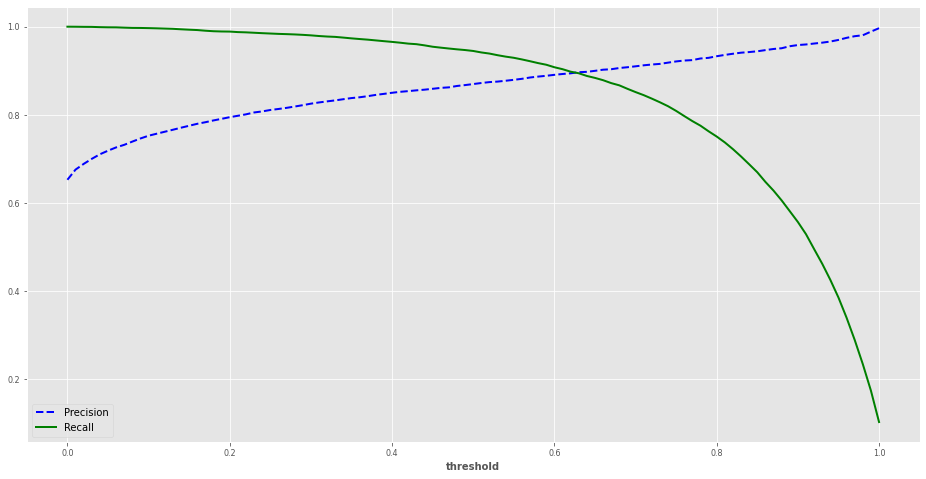

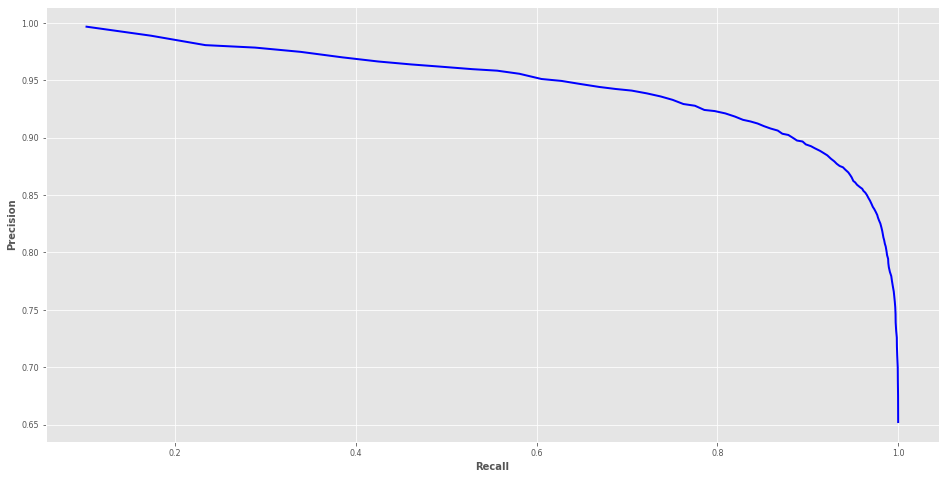

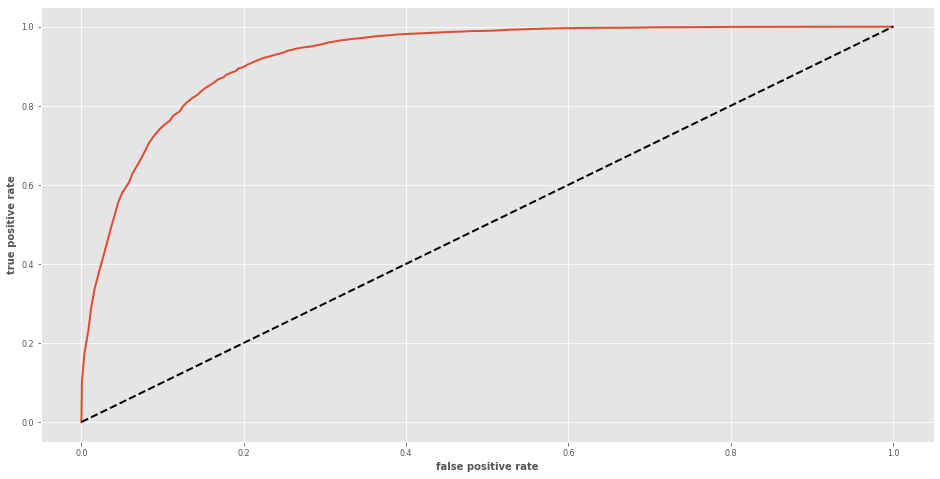

In [ ]:
#andamenti di precision e recall
precisions,recalls,thresholds = precision_recall_curve(y_train,y_score_rf_new)
plot_precision_recall_vs_threshold(precisions, recalls, thresholds)
plt.show()
 
plot_decision_vs_recall(precisions, recalls, thresholds)
plt.show()

fpr,tpr,thresholds=roc_curve(y_train,y_score_rf_new)

plot_roc_curve(fpr,tpr)
plt.show()

Valutiamo l'algoritmo sul test set

In [ ]:
threshold=0.8 #valore della threshold scelto come esempio per plottare la matrice di confusione
y_pred_rf_new=best_rf_new.predict_proba(X_test)[:,1]
print(f'AUC_test:{roc_auc_score(y_test,y_pred_rf_new)}')

AUC_test:0.9257074036511156


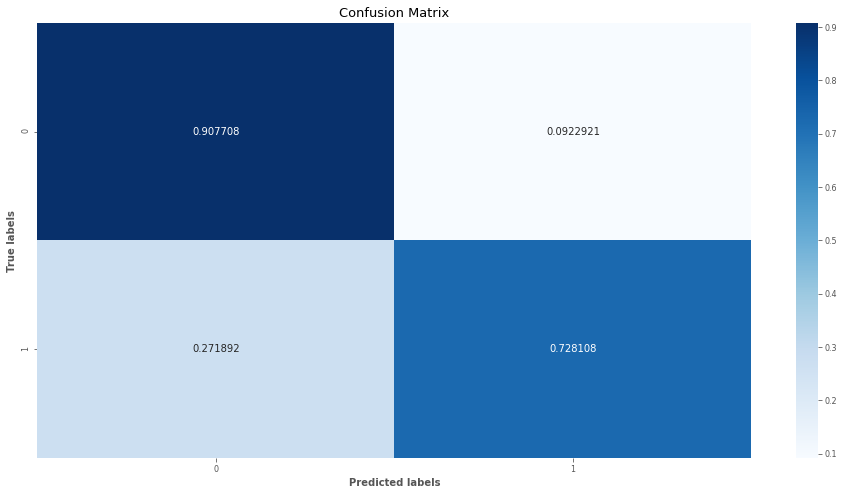

In [ ]:
y_rf_th_new= y_pred_rf_new > threshold

ax= plt.subplot()
sns.heatmap(confusion_matrix(y_test,y_rf_th_new,normalize='true'), cmap=plt.cm.Blues, annot=True, fmt='g', ax=ax);  #annot=True to annotate cells, ftm='g' to disable scientific notation

ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['0', '1']); ax.yaxis.set_ticklabels(['0', '1']);

# **NEURAL NETWORK**

I modelli lineari per la classificazione e regressione prendono la forma
$$y(\vec{x},\vec{w})=f\bigg(\sum_{j=1}^{M}w_j\phi_{j}(\vec{x})\bigg)$$

Lo scopo delle reti neurali è quello di estendere tale modello rendendo le funzioni base $\phi_j$ dipendenti a loro volta dai coefficienti $w_j$

Questo si può fare sostituendo alle funzioni base l'espressione $z_j=h(a_j)$ con
$$a_j=\sum_{i=1}^{D}w_{ji}^{(1)}x_i+w_{j0}^{(1)}$$

$z_j$ sono chiamate *hidden units*.

Riferendoci all'espressione iniziale di $y$ dobbiamo ancora fare la combinazione delle $z_j$ con altri parametri:
$$a_k=\sum_{j=1}^{M}w_{kj}^{(2)}z_j+w_{k0}^{(2)}  $$ e quindi *per ogni output della rete neurale* 
$$y_k=\sigma(a_k)$$
Se compattiamo l'espressione delle $a_j$ come segue
$$a_j=\sum_{i=0}^{D}w_{ji}^{(1)}x_i$$
esplicitando $y_k$ otteniamo
$$y_k(\vec{x},\vec{w})=\sigma\bigg(\sum_{j=0}^{M}w_{kj}^{(2)}h\bigg(\sum_{i=0}^{D}w_{ji}^{(1)}x_i\bigg)\bigg)$$
Per il caso della classificazione binaria possiamo definire la funzione costo come nel caso della logistc regression:
$$E(\vec{w})=-\sum_{n=1}^{N}\big(t_nln(y_n)+(1-y_n)ln(1-y_n)\big)$$
Notiamo che per una classificazione binaria, basta un solo output nella rete neurale il quale predice la possibilità di un elemento di appartenere a una classe. La probabilità della seconda classe è in questo modo univocamente determinata dalla prima. Nell'espressione di $E(\vec{w})$ allora $y_n$ è l'ouput restituito dalla rete neurale una volta che diamo in input l'elemento $x_n$.


**Error Backpropagation**

Avendo la funzione costo, possiamo minimizzarla ad esempio con la discesa del gradiente.Per farlo quindi dobbiamo calcolare le derivate della funzione costo rispetto ai parametri $w_{ji}$. L'algoritmo di retropropagazione ci aiuta nel calcolo di queste derivate.

Per la regola della catena vale
$$\frac{\partial E_n}{\partial w_{ji}}=\frac{\partial E_n}{\partial a_j}\frac{\partial a_j}{\partial w_{ji}}=\delta_jz_i$$
In questa espressione $z_j$ lo conosciamo perchè è proprio quello che la rete ha calcolato della fase "forward". Resta da calcolare $\delta_j\equiv \frac{\partial E_n}{\partial a_j}$.

Per l'output della rete vale il risultato sempre valido
$$\delta_k=y_k-t_k$$
mentre per le hidden units
$$\delta_j=\sum_k\frac{\partial E_n}{\partial a_k}\frac{\partial a_k}{\partial a_j}$$
La somma è fatta su tutte le k-unità a cui l'unità j è collegata. 

Infine usando le precenti equazioni per le $a_k$:

$$\delta_j=h^{'}(a_j)\sum_{k}w_{kj}\delta_k$$

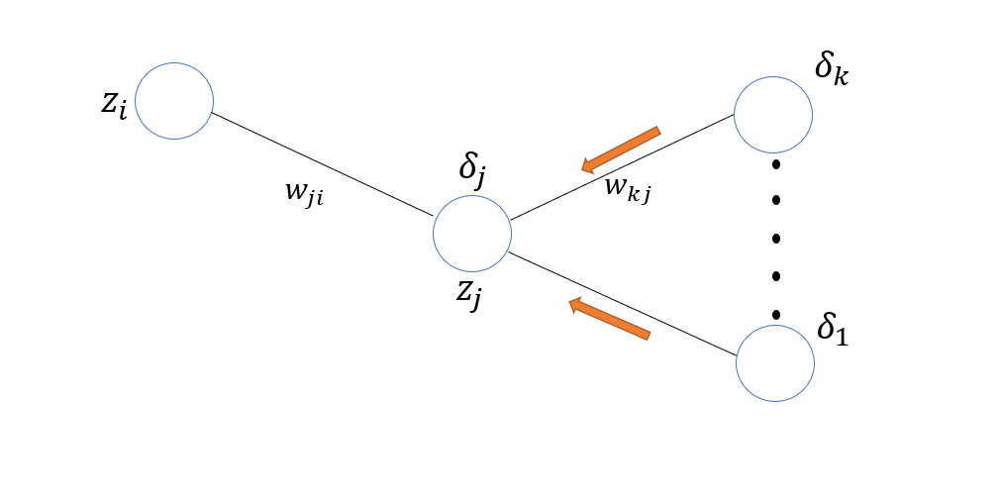

In [ ]:
X_train_full,X_test,y_train_full,y_test=train_test_split(X,y,test_size=0.3,random_state=42,stratify=y)

In [ ]:
sc=StandardScaler() #mean=0, variance=1
X_train_full=sc.fit_transform(X_train_full)
X_test=sc.transform(X_test)

In [ ]:
X_val,X_train=X_train_full[:2000],X_train_full[2000:]
y_val,y_train=y_train_full[:2000],y_train_full[2000:]
print(f'numero di esempi in X_train: {len(y_train)}')
print(f'numero di esempi in X_val: {len(y_val)}')

numero di esempi in X_train: 11233
numero di esempi in X_val: 2000


In [ ]:
pv=0.
tot_val=len(y_val)
for el in y_val:
  if el==0:
    pv+=0
  else:
    pv+=1
nv=0.
for el in y_val:
  if el==0:
    nv+=1
  else:
    nv+=0
tot_train=len(y_train)
p=0.
for el in y_train:
  if el==0:
    p+=0
  else:
    p+=1
n=0.
for el in y_train:
  if el==0:
    n+=1
  else:
    n+=0
print(f'eventi gamma nel training set: %.3f %%' %(p/tot_train*100))
print(f'eventi di fondo nel training set: %.3f %%' %(n/tot_train*100))
print(f'eventi gamma nel validation set: %.3f %%' %(pv/tot_val*100))
print(f'eventi di fondo nel validation set: %.3f %%' %(nv/tot_val*100))

eventi gamma nel training set: 65.406 %
eventi di fondo nel training set: 34.594 %
eventi gamma nel validation set: 64.250 %
eventi di fondo nel validation set: 35.750 %


Istanziamo una prima rete neurale semplice per vedere come si comporta

In [ ]:
neg, pos = np.bincount(dataset['target'])
total = neg + pos
print('Examples:\n    Total: {}\n    Positive: {} ({:.2f}% of total)\n'.format(
    total, pos, 100 * pos / total))

Examples:
    Total: 18905
    Positive: 12332 (65.23% of total)



In [ ]:
# Scaling by total/2 helps keep the loss to a similar magnitude.
# The sum of the weights of all examples stays the same.
weight_for_0 = (1 / neg) * (total / 2.0)
weight_for_1 = (1 / pos) * (total / 2.0)

class_weight = {0: weight_for_0, 1: weight_for_1}

print('Weight for class 1: {:.2f}'.format(weight_for_0))
print('Weight for class 0: {:.2f}'.format(weight_for_1))

Weight for class 1: 1.42
Weight for class 0: 0.77


In [ ]:
class_weight={0:1.42,
              1:0.77}

In [ ]:
model=keras.models.Sequential([
                               keras.layers.InputLayer(10),
                               keras.layers.Dense(5,activation='elu',kernel_initializer="he_normal"),

                               keras.layers.Dense(1,activation='sigmoid')
])

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 5)                 55        
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 6         
Total params: 61
Trainable params: 61
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=[tf.keras.metrics.AUC(name='AUC'),tf.keras.metrics.Precision(name='precision',thresholds=0.7)])

In [ ]:
history=model.fit(X_train,y_train,epochs=30,validation_data=(X_val,y_val),class_weight=class_weight)

Epoch 1/30
352/352 [==============================] - 2s 2ms/step - loss: 0.5519 - AUC: 0.7884 - precision: 0.8968 - val_loss: 0.4927 - val_AUC: 0.8344 - val_precision: 0.8941
Epoch 2/30
352/352 [==============================] - 0s 1ms/step - loss: 0.4853 - AUC: 0.8431 - precision: 0.9015 - val_loss: 0.4684 - val_AUC: 0.8510 - val_precision: 0.8980
Epoch 3/30
352/352 [==============================] - 0s 1ms/step - loss: 0.4641 - AUC: 0.8589 - precision: 0.9060 - val_loss: 0.4504 - val_AUC: 0.8644 - val_precision: 0.9101
Epoch 4/30
352/352 [==============================] - 0s 1ms/step - loss: 0.4484 - AUC: 0.8701 - precision: 0.9111 - val_loss: 0.4360 - val_AUC: 0.8738 - val_precision: 0.9114
Epoch 5/30
352/352 [==============================] - 0s 1ms/step - loss: 0.4361 - AUC: 0.8787 - precision: 0.9191 - val_loss: 0.4260 - val_AUC: 0.8811 - val_precision: 0.9163
Epoch 6/30
352/352 [==============================] - 0s 1ms/step - loss: 0.4268 - AUC: 0.8847 - precision: 0.9199 - val

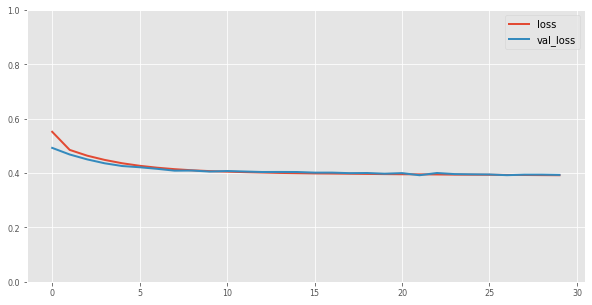

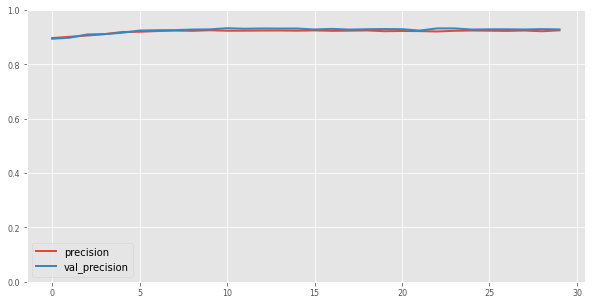

In [ ]:
#plt.subplot(2,1,1)
plt.figure(figsize=(10,5))
plt.plot(history.epoch,history.history['loss'],label='loss')
plt.plot(history.epoch,history.history['val_loss'],label='val_loss')
#plt.plot(history.epoch,history.history['accuracy'],label='accuracy')
#plt.plot(history.epoch,history.history['val_accuracy'],label='val_accuracy')
plt.grid(True)
plt.gca().set_ylim(0, 1) # set the vertical range to [0-1]
plt.legend()
plt.show()
plt.figure(figsize=(10,5))
plt.plot(history.epoch,history.history['precision'],label='precision')
plt.plot(history.epoch,history.history['val_precision'],label='val_precision')
plt.grid(True)
plt.gca().set_ylim(0, 1) # set the vertical range to [0-1]
plt.legend()
plt.show()

*SELF-NORMALIZING* neural network

Costruiremo la rete neurale con la proprietà di *auto-normalizzazione*: l'output di ogni layer tende a preservare media 0 e varianza 1. Questa proprietà di auto-normalizzazione aiuta a prevenire il problema del *vanishing|exploding gradient*. Una rete neurale che si auto normalizza deve avere le seguenti caratteristiche:

* l'input deve essere standardizzato
*funzione di attivazione: SELU (Scaled ELU)
$$\lambda x \space\space\text{per}\space x>0$$ SELU: $$\lambda\alpha(e^x-1)\space\space\text{per}\space x<0$$
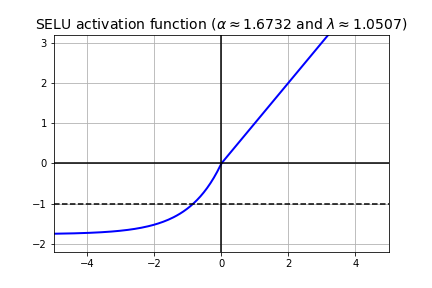
*i pesi di ogni hidden-layer devono essere inizializzati con l'inizializzazione LeCun normal. Questo si fa campionando una distribuzione normale centrata in 0 e con deviazione standard $std=\sqrt\frac{1}{fan_{in}}$. Notiamo che di default la rete neurale in keras è inizializzata con la Glorot initialization: $std=\sqrt{\frac{1}{fan_{avg}}}$.
*regolarizzazione: Alpha dropout
*il modello usato deve essere un modello sequenziale
*tutti gli hidden layer devono essere densi


In [ ]:
best_model=keras.models.Sequential([
                               keras.layers.InputLayer(10),
                               keras.layers.Dense(25,activation='selu',kernel_initializer='lecun_normal'),
                               keras.layers.AlphaDropout(rate=0.01),
                               keras.layers.Dense(25,activation='selu',kernel_initializer='lecun_normal'),
                               keras.layers.AlphaDropout(rate=0.01),
                               keras.layers.Dense(25,activation='selu',kernel_initializer='lecun_normal'),
                               keras.layers.AlphaDropout(rate=0.01),
                               keras.layers.Dense(25,activation='selu',kernel_initializer='lecun_normal'),
                               keras.layers.AlphaDropout(rate=0.01),
                               keras.layers.Dense(25,activation='selu',kernel_initializer='lecun_normal'),
                               keras.layers.AlphaDropout(rate=0.01),
                               keras.layers.Dense(1,activation='sigmoid')
])
best_model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2 (Dense)              (None, 25)                275       
_________________________________________________________________
alpha_dropout (AlphaDropout) (None, 25)                0         
_________________________________________________________________
dense_3 (Dense)              (None, 25)                650       
_________________________________________________________________
alpha_dropout_1 (AlphaDropou (None, 25)                0         
_________________________________________________________________
dense_4 (Dense)              (None, 25)                650       
_________________________________________________________________
alpha_dropout_2 (AlphaDropou (None, 25)                0         
_________________________________________________________________
dense_5 (Dense)              (None, 25)               

In [ ]:
best_model.compile(loss='binary_crossentropy',
              optimizer='nadam',
              metrics=[tf.keras.metrics.AUC(name='AUC'),tf.keras.metrics.Precision(name='precision')])
history=best_model.fit(X_train,y_train,validation_data=(X_val,y_val),epochs=50,class_weight=class_weight)

Epoch 1/50
352/352 [==============================] - 2s 3ms/step - loss: 0.4783 - AUC: 0.8477 - precision: 0.8503 - val_loss: 0.4496 - val_AUC: 0.8872 - val_precision: 0.9004
Epoch 2/50
352/352 [==============================] - 1s 2ms/step - loss: 0.4197 - AUC: 0.8852 - precision: 0.8746 - val_loss: 0.3713 - val_AUC: 0.9049 - val_precision: 0.8581
Epoch 3/50
352/352 [==============================] - 1s 2ms/step - loss: 0.4064 - AUC: 0.8919 - precision: 0.8732 - val_loss: 0.3548 - val_AUC: 0.9165 - val_precision: 0.8849
Epoch 4/50
352/352 [==============================] - 1s 2ms/step - loss: 0.3867 - AUC: 0.9020 - precision: 0.8826 - val_loss: 0.3405 - val_AUC: 0.9166 - val_precision: 0.8593
Epoch 5/50
352/352 [==============================] - 1s 2ms/step - loss: 0.3825 - AUC: 0.9056 - precision: 0.8813 - val_loss: 0.3397 - val_AUC: 0.9174 - val_precision: 0.8775
Epoch 6/50
352/352 [==============================] - 1s 2ms/step - loss: 0.3708 - AUC: 0.9112 - precision: 0.8865 - val

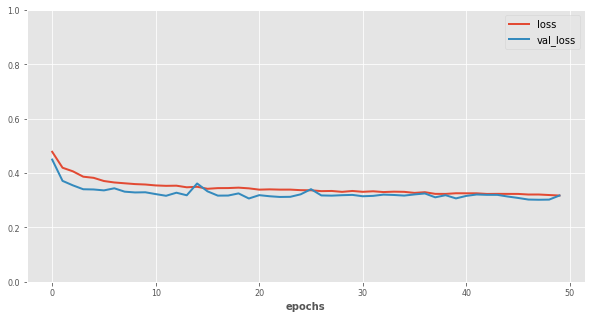

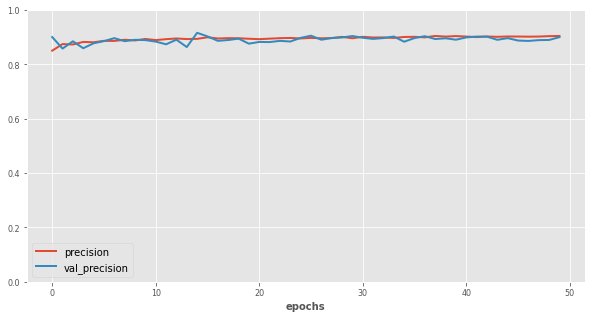

In [ ]:
#plt.subplot(2,1,1)
plt.figure(figsize=(10,5))
plt.plot(history.epoch,history.history['loss'],label='loss')
plt.plot(history.epoch,history.history['val_loss'],label='val_loss')
plt.xlabel('epochs')
#plt.plot(history.epoch,history.history['accuracy'],label='accuracy')
#plt.plot(history.epoch,history.history['val_accuracy'],label='val_accuracy')
plt.grid(True)
plt.gca().set_ylim(0, 1) # set the vertical range to [0-1]
plt.legend()
plt.show()
plt.figure(figsize=(10,5))
plt.plot(history.epoch,history.history['precision'],label='precision')
plt.plot(history.epoch,history.history['val_precision'],label='val_precision')
plt.grid(True)
plt.gca().set_ylim(0, 1) # set the vertical range to [0-1]
plt.legend()
plt.xlabel('epochs')
plt.show()

Notiamo una cosa interessante: la curva di loss va giù più di quanto sale la curva della precision. Questo significa che l'algoritmo, una volta raggiunto quel valore di precision, sta imparando a minimizzare i falsi negativi.

In [ ]:
def build_model(n_hidden=5, n_neurons=25, input_shape=[10]):
  model = keras.models.Sequential()
  options = {"input_shape": input_shape}
  for layer in range(n_hidden):
    model.add(keras.layers.Dense(n_neurons, activation="selu",kernel_initializer="lecun_normal",**options))
    model.add(keras.layers.AlphaDropout(rate=0.01))
    options = {}
  model.add(keras.layers.Dense(1,activation='sigmoid', **options))
  optimizer = 'nadam'
  model.compile(loss="binary_crossentropy", optimizer=optimizer,metrics=[tf.keras.metrics.AUC(from_logits=True,name='AUC'),tf.keras.metrics.Precision(thresholds=0.8),'accuracy'])
  return model
keras_class = keras.wrappers.scikit_learn.KerasClassifier(build_model)
keras_class.fit(X_train,y_train,epochs=50,validation_data=(X_val,y_val),class_weight=class_weight)

Epoch 1/50
352/352 [==============================] - 2s 3ms/step - loss: 0.5079 - AUC: 0.8235 - precision: 0.9177 - accuracy: 0.7526 - val_loss: 0.4916 - val_AUC: 0.8776 - val_precision: 0.9493 - val_accuracy: 0.7600
Epoch 2/50
352/352 [==============================] - 1s 2ms/step - loss: 0.4315 - AUC: 0.8777 - precision: 0.9360 - accuracy: 0.8031 - val_loss: 0.3827 - val_AUC: 0.9034 - val_precision: 0.9463 - val_accuracy: 0.8235
Epoch 3/50
352/352 [==============================] - 1s 2ms/step - loss: 0.4137 - AUC: 0.8881 - precision: 0.9357 - accuracy: 0.8177 - val_loss: 0.3634 - val_AUC: 0.9042 - val_precision: 0.9297 - val_accuracy: 0.8455
Epoch 4/50
352/352 [==============================] - 1s 2ms/step - loss: 0.4008 - AUC: 0.8955 - precision: 0.9404 - accuracy: 0.8214 - val_loss: 0.3555 - val_AUC: 0.9109 - val_precision: 0.9343 - val_accuracy: 0.8535
Epoch 5/50
352/352 [==============================] - 1s 2ms/step - loss: 0.3927 - AUC: 0.8993 - precision: 0.9435 - accuracy: 0

Se vogliamo fare un confronto più giusto dei valori AUC su training e validation set non basta guardare ai precedenti risultati. Questo perchè la regolarizzazione dropout è attiva solo durante la fase di training, quindi i risultati sul training set precedentemente printati sono affetti da tale regolarizzazione. Rivalutiamo le prestazioni sul training set con "predict".

In [ ]:
predict_train=keras_class.predict(X_train)
proba_train=keras_class.predict_proba(X_train)[:,1]
print(f'AUC_train:{roc_auc_score(y_train,proba_train)}')

AUC_train:0.9437185070549872


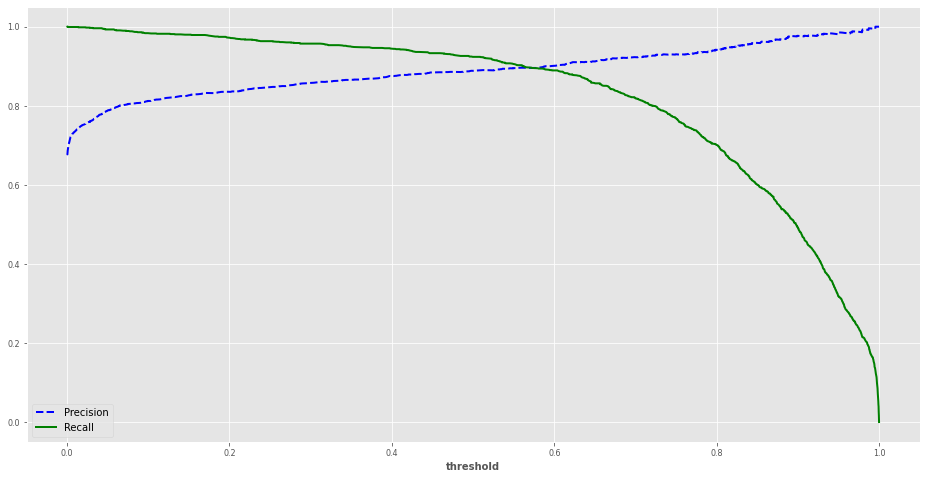

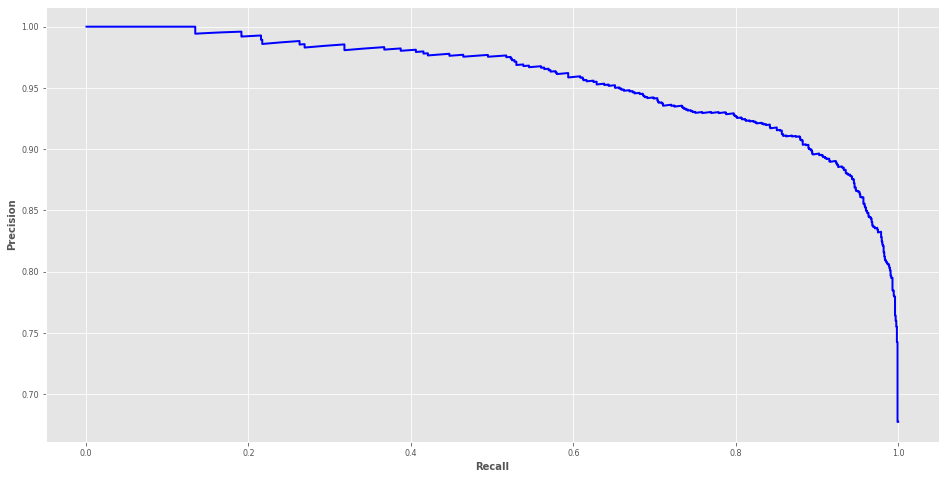

In [ ]:
predict_DNN=keras_class.predict_proba(X_val)[:,1]
precisions,recalls,thresholds=precision_recall_curve(y_val,predict_DNN)
plot_precision_recall_vs_threshold(precisions, recalls, thresholds)
plt.show()

plot_decision_vs_recall(precisions, recalls, thresholds)
plt.show()

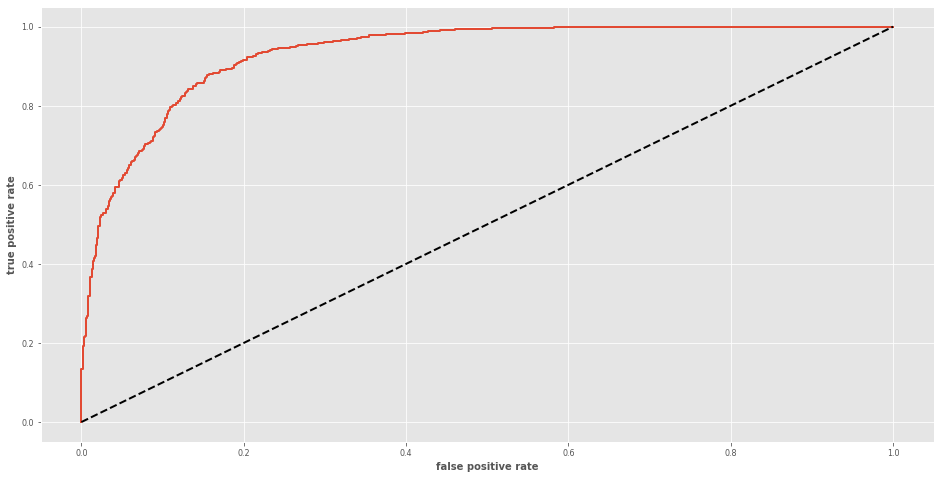

In [ ]:
fpr,tpr,thresholds=roc_curve(y_val,predict_DNN)
plot_roc_curve(fpr,tpr)
plt.show()

VALUTAZIONE SUL TEST SET

In [ ]:
threshold=0.7 #valore della threshold scelto come esempio per plottare la matrice di confusione
proba_test=keras_class.predict_proba(X_test)[:,1]
predict_test=np.multiply(keras_class.predict_proba(X_test)[:,1]>threshold,1) #vettore binario a seconda che la probabilità sia maggiore o minore di una threshold da scegliere
print(f'AUC_train:{roc_auc_score(y_test,proba_test)}')

AUC_train:0.930495312756976


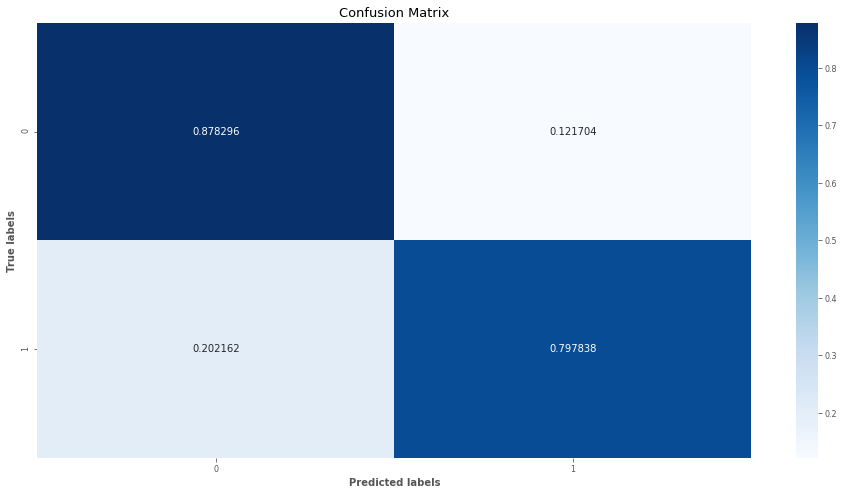

In [ ]:
ax= plt.subplot()
sns.heatmap(confusion_matrix(y_test,predict_test,normalize='true'), cmap=plt.cm.Blues, annot=True, fmt='g', ax=ax);  #annot=True to annotate cells, ftm='g' to disable scientific notation

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['0', '1']); ax.yaxis.set_ticklabels(['0', '1']);

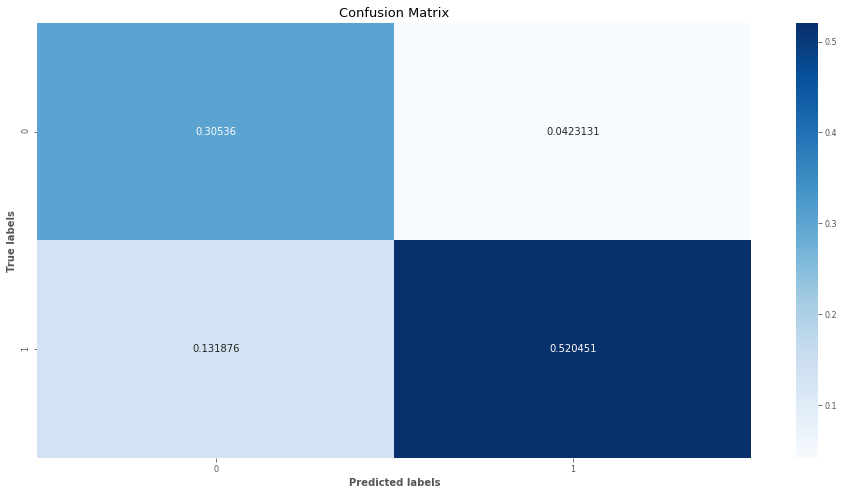

In [ ]:
ax= plt.subplot()
sns.heatmap(confusion_matrix(y_test,predict_test,normalize='all'), cmap=plt.cm.Blues, annot=True, fmt='g', ax=ax);  #annot=True to annotate cells, ftm='g' to disable scientific notation

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['0', '1']); ax.yaxis.set_ticklabels(['0', '1']);